<a href="https://colab.research.google.com/github/hrumst/ML/blob/NS-gclb-2/gclb2-4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
%config IPComplater.greedy = True

In [2]:
from google.colab import drive
drive.mount('./DRIVE', force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at ./DRIVE


In [0]:
!rm -rf sample_data

In [0]:
!rm -rf inputs/plates

In [5]:
import shutil, os
shutil.copytree('./DRIVE/My Drive/Colab Notebooks/input/plates', 'inputs/plates')

'inputs/plates'

In [6]:
s = []
s.append(1)
s.append(2)
s.append(3)
s = s[1:]
print(s)

[2, 3]


In [0]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import copy

import torch, torch.nn
from torch import nn
from torchvision import transforms, models
import torchvision

In [8]:
!rm -rf val && rm -rf train

data_root = 'inputs/plates/plates/'
#%%

import shutil 
from tqdm import tqdm

train_dir = 'train'
val_dir = 'val' # validation

class_names = ['cleaned', 'dirty']

# удобное копирование картинок по папкам
for dir_name in [train_dir, val_dir]:
    for class_name in class_names:
        os.makedirs(os.path.join(dir_name, class_name), exist_ok=True)

val_examples = 0
for class_name in class_names:
    source_dir = os.path.join(data_root, 'train', class_name)
    for i, file_name in enumerate(tqdm(os.listdir(source_dir))):
        # if i % 100 != 0:
        dest_dir = os.path.join(train_dir, class_name)
        shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_dir, file_name))
        # else:
            # val_examples += 1
            # dest_dir = os.path.join(val_dir, class_name)
            # shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_dir, file_name))

for class_name in class_names:
    source_dir = os.path.join(data_root, 'ext-test', class_name)
    for i, file_name in enumerate(tqdm(os.listdir(source_dir))):
        val_examples += 1
        dest_dir = os.path.join(val_dir, class_name)
        shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_dir, file_name))

100%|██████████| 25/25 [00:00<00:00, 4215.04it/s]


In [0]:
import PIL.Image
import random
batch_size = 8

def color_shuffler(pic: PIL.Image):
    arr_pic = np.array(pic)
    sl = [arr_pic[:,:, 0], arr_pic[:,:, 1], arr_pic[:,:, 2]]
    rl = [0,1,2]
    random.shuffle(rl)
    for (i, ri) in enumerate(rl):
        arr_pic[:,:, i] = sl[ri]
    im = PIL.Image.fromarray(arr_pic.astype(np.uint8))
    return im

def color_rand_factory(from_val, to_val):
    def color_rand(pic: PIL.Image):
        arr_pic = np.array(pic)
        rl = random.randint(0,2)
        arr_pic[:,:,rl] = arr_pic[:,:,rl] + random.randint(from_val, to_val)
        im = PIL.Image.fromarray(arr_pic.astype(np.uint8))
        return im
    return color_rand

train_transforms = transforms.Compose([
    # аугментация
    torchvision.transforms.RandomApply([torchvision.transforms.Lambda(color_shuffler)], p=.85),
    torchvision.transforms.RandomApply([torchvision.transforms.Lambda(color_rand_factory(-30,30))], p=.25),
    torchvision.transforms.RandomApply([transforms.ColorJitter()], p=.5),
    transforms.RandomRotation(30),
    transforms.CenterCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    # нормализация викторов картинок под рез-нет
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    # нормализация викторов картинок под рез-нет
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_dataset = torchvision.datasets.ImageFolder(train_dir, train_transforms)
val_dataset = torchvision.datasets.ImageFolder(val_dir, val_transforms)


In [0]:
def unfreeze_layer(model, layer, params):
    un_freezed = 0
    for name, child in model.named_children():
        if name != layer:
            continue
        for chName, chChild in child.named_children():
            if int(chName) not in params:
                continue
            for (i,param) in enumerate(chChild.parameters()):
                param.requires_grad = True         
                un_freezed += 1
    print('\nUnfreezed for layer#{}: {}'.format(layer, un_freezed))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


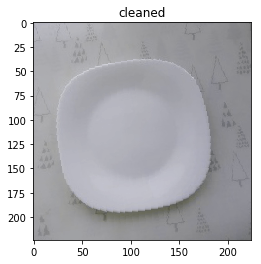

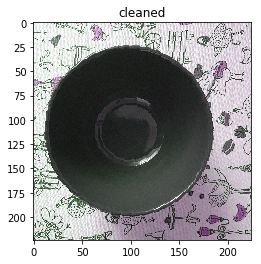

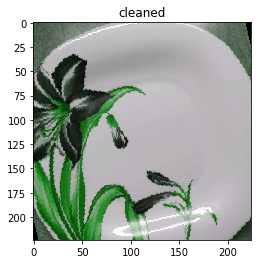

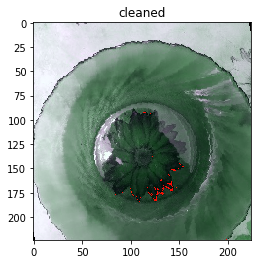

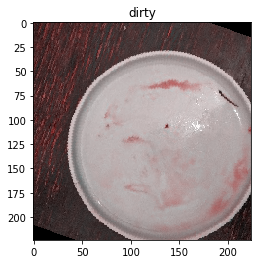

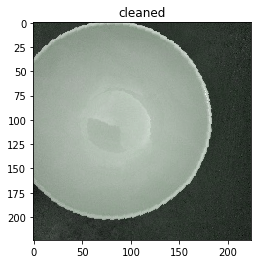

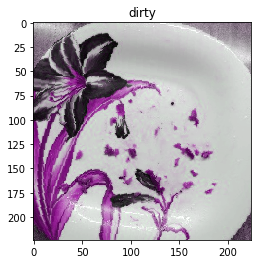

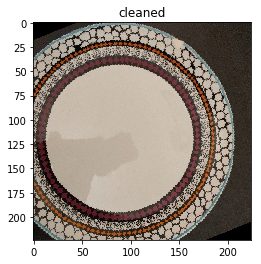

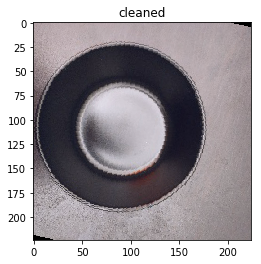

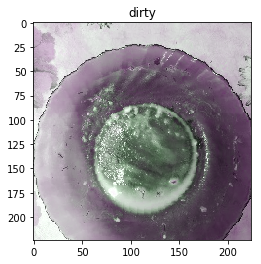

In [11]:
#%%

batch_size = 10
train_dataloader = torch.utils.data.DataLoader(
    train_dataset, batch_size=batch_size, shuffle=True, num_workers=batch_size)
val_dataloader = torch.utils.data.DataLoader(
    val_dataset, batch_size=batch_size, shuffle=False, num_workers=batch_size)
len(train_dataloader), len(train_dataloader)

X_batch, y_batch = next(iter(train_dataloader))
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
# денормализация векторов для печати
plt.imshow(X_batch[0].permute(1, 2, 0).numpy() * std + mean);

#%%

def show_input(input_tensor, title=''):
    image = input_tensor.permute(1, 2, 0).numpy()
    image = std * image + mean
    plt.imshow(image.clip(0, 1))
    plt.title(title)
    plt.show()
    plt.pause(0.001)

X_batch, y_batch = next(iter(train_dataloader))

for x_item, y_item in zip(X_batch, y_batch):
    show_input(x_item, title=class_names[y_item])

In [0]:
def make_resnext101_32x8d():
    model = models.resnext101_32x8d(pretrained=True)
    model.fc = nn.Sequential(
        nn.BatchNorm1d(model.fc.in_features),
        nn.Linear(model.fc.in_features, 100),
        nn.BatchNorm1d(100),
        nn.ELU(),
        nn.Linear(100, 2)
    )

    passed, muted = {}, {}
    for name, child in model.named_children():
        if name in ['layer4', 'avgpool', 'fc']:
            if name not in passed:
                passed[name] = 0
            for (i,param) in enumerate(child.parameters()):
                passed[name] += 1
        else:
            if name not in muted:
                muted[name] = 0
            for (i,param) in enumerate(child.parameters()):
                param.requires_grad = False         
                muted[name] += 1
    
    sum_muted, sum_passed = 0, 0
    for k, v in muted.items():
        sum_muted += v
    for k, v in passed.items():
        sum_passed += v
    
    print(muted, passed)
    print('total muted:', sum_muted, 'total passed:', sum_passed)
    return model

def resnet101_32x8d_unfreeze_3l(model, epoch_num, train_):
    if epoch_num == 75:
        unfreeze_layer(model, 'layer3', [20, 21,22])
    elif epoch_num == 125:
        unfreeze_layer(model, 'layer3', [18,19])

In [0]:
x = torch.tensor(0.975).item()
x

0.9750000238418579

In [0]:
# pretrained=True сеть уже пред-тренерована на гугловом имадже-нете
def make_resnet152():
    model = models.resnet152(pretrained=True)
    model.fc = nn.Sequential(
        nn.BatchNorm1d(model.fc.in_features),
        nn.Linear(model.fc.in_features, 100),
        nn.BatchNorm1d(100),
        nn.ELU(),
        nn.Linear(100, 2)
    )
    
    passed, muted = {}, {}
    for name, child in model.named_children():
        if name in ['layer4', 'avgpool', 'fc']:
            if name not in passed:
                passed[name] = 0
            for (i,param) in enumerate(child.parameters()):
                passed[name] += 1
                
        elif name == 'layer3':
            for chName, chChild in child.named_children():
                if name not in muted:
                    muted[name] = 0
                if int(chName) not in [34, 35]:
                    for (i,param) in enumerate(chChild.parameters()):
                        param.requires_grad = False         
                        muted[name] += 1
                else:
                    if name not in passed:
                        passed[name] = 0
                    for (i,param) in enumerate(chChild.parameters()):       
                        passed[name] += 1
        else:
            if name not in muted:
                muted[name] = 0
            for (i,param) in enumerate(child.parameters()):
                param.requires_grad = False         
                muted[name] += 1
    
    sum_muted, sum_passed = 0, 0
    for k, v in muted.items():
        sum_muted += v
    for k, v in passed.items():
        sum_passed += v
    
    print(muted, passed)
    print('total muted:', sum_muted, 'total passed:', sum_passed)
    return model

def resnet152_unfreeze_3l(model, epoch_num, train_):
    if epoch_num == 100:
        unfreeze_layer(model, 'layer3', [32, 33])

def resnet152_unfreeze_3l_factory(stack_len):
    acc_stack = []
    last_unfreezed = 34
    def resnet152_unfreeze_3l(model, epoch_num, train_acc):
        nonlocal acc_stack
        nonlocal last_unfreezed
        acc_stack.append(train_acc)
        if len(acc_stack) < stack_len:
            return
        acc_stack = acc_stack[1:]
        stack_sum = .0
        for stack_acc_val in acc_stack:
            stack_sum += round(stack_acc_val, 4)
        if round(acc_stack[0], 4) == round(stack_sum / stack_len, 4):
            acc_stack = []
            last_unfreezed -= 1
            print('\nNew last unfreezed:', last_unfreezed)
            unfreeze_layer(model, 'layer3', [last_unfreezed])
    return resnet152_unfreeze_3l

In [0]:
class EpochModel():
    def __init__(self, train_dataloader, val_dataloader, model, loss, optimizer, scheduler, device, unfreeze_func=None):
        self.train_dataloader = train_dataloader
        self.val_dataloader = val_dataloader
        self.model = model
        self.loss = loss
        self.optimizer = optimizer
        self.scheduler = scheduler
        self.unfreeze_func = unfreeze_func
        
        self.device = device
        
        self.train_ac_history = []
        self.val_ac_history = []

        self.fail_cmp_stats = {}
        for i in range(0, val_examples):
             self.fail_cmp_stats[i] = 0
        
    def train(self, num_epochs, train_phases=None):
        if train_phases is None:
            train_phases = [self._epoch_train, self._epoch_validate]
        for epoch in range(num_epochs):
            print('Epoch {}/{}:'.format(epoch, num_epochs - 1), flush=True)
            for phase in train_phases:
                phase_name, phase_acc = phase()
                if phase_name == 'train':
                    self.unfreeze_func(self.model, epoch, phase_acc.item())
        return model

    def _print_log(self, phase, epoch_loss, epoch_acc):
        print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc), flush=True)
    
    def _epoch_validate(self):
        self.model.eval()

        running_loss = 0.
        running_acc = 0.
        running_acc_m = 0.

        i_acc = 0
        for inputs, labels in tqdm(self.val_dataloader):
            inputs = inputs.to(self.device)
            labels = labels.to(self.device)

            self.optimizer.zero_grad()
            with torch.set_grad_enabled(False):
                preds = self.model(inputs)
                loss_value = self.loss(preds, labels)
                preds_class = preds.argmax(dim=1)

            running_loss += loss_value.item()
            running_acc = (preds_class == labels.data)
            running_acc_m += running_acc.float().mean()

            for run_acc_item in running_acc:
                if run_acc_item == 0:
                    self.fail_cmp_stats[i_acc] += 1
                i_acc += 1
        
        epoch_loss = running_loss / len(self.val_dataloader)
        epoch_acc = running_acc_m / len(self.val_dataloader)
        self._print_log('validate', epoch_loss, epoch_acc)
        self.val_ac_history.append(epoch_acc.item())
        return ('validate', epoch_acc)

    def _epoch_train(self):
        self.model.train()

        running_loss = 0.
        running_acc = 0.

        for inputs, labels in tqdm(self.train_dataloader):
            inputs = inputs.to(self.device)
            labels = labels.to(self.device)

            self.optimizer.zero_grad()
            with torch.set_grad_enabled(True):
                preds = self.model(inputs)
                loss_value = self.loss(preds, labels)
                preds_class = preds.argmax(dim=1)
                # train work
                loss_value.backward()
                self.optimizer.step()

            running_loss += loss_value.item()
            running_acc += (preds_class == labels.data).float().mean()

        epoch_loss = running_loss / len(self.train_dataloader)
        epoch_acc = running_acc / len(self.train_dataloader)

        # train work
        self.scheduler.step(epoch_loss)

        self._print_log('train', epoch_loss, epoch_acc)
        self.train_ac_history.append(epoch_acc.item())
        return ('train', epoch_acc)

In [16]:
batch_size = 8

train_dataloader = torch.utils.data.DataLoader(
    train_dataset, batch_size=batch_size, shuffle=True, num_workers=batch_size)
val_dataloader = torch.utils.data.DataLoader(
    val_dataset, batch_size=batch_size, shuffle=False, num_workers=batch_size)
len(train_dataloader), len(train_dataloader)
            

tme_history = []
for i in range(0,10):
    torch.backends.cudnn.deterministic = True
    torch.cuda.manual_seed(i)
    np.random.seed(i)
    torch.manual_seed(i)

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model = make_resnet152().to(device)

    for _ in [1]:
        loss = torch.nn.CrossEntropyLoss()
        optimizer = torch.optim.Adamax(model.parameters(), lr=.002)

        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, verbose=True)

        tme = EpochModel(train_dataloader, val_dataloader, model, loss, optimizer, scheduler, device, resnet152_unfreeze_3l)
        tme_history.append(tme)
        tme.train(200)

{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 75, 'layer3': 309} {'layer3': 18, 'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 417 total passed: 56
Epoch 0/199:


100%|██████████| 5/5 [00:01<00:00,  2.66it/s]

train Loss: 0.5604 Acc: 0.7250



100%|██████████| 6/6 [00:01<00:00,  4.34it/s]

validate Loss: 2.0131 Acc: 0.7917
Epoch 1/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.3578 Acc: 0.8250



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 2.3423 Acc: 0.6792
Epoch 2/199:



100%|██████████| 5/5 [00:01<00:00,  2.89it/s]

train Loss: 0.5140 Acc: 0.7500



100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

validate Loss: 1.1873 Acc: 0.7042
Epoch 3/199:



100%|██████████| 5/5 [00:01<00:00,  2.90it/s]

train Loss: 0.3015 Acc: 0.9000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 1.2161 Acc: 0.6042
Epoch 4/199:



100%|██████████| 5/5 [00:01<00:00,  2.89it/s]

train Loss: 0.2141 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.47it/s]

validate Loss: 0.7763 Acc: 0.6042
Epoch 5/199:



100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

train Loss: 0.3147 Acc: 0.8500



100%|██████████| 6/6 [00:01<00:00,  4.38it/s]

validate Loss: 0.4195 Acc: 0.7500
Epoch 6/199:



100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

train Loss: 0.1513 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.3476 Acc: 0.8542
Epoch 7/199:



100%|██████████| 5/5 [00:01<00:00,  2.92it/s]

train Loss: 0.2086 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.4374 Acc: 0.7083
Epoch 8/199:



100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

train Loss: 0.1147 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.42it/s]

validate Loss: 0.5098 Acc: 0.6458
Epoch 9/199:



100%|██████████| 5/5 [00:01<00:00,  2.97it/s]

train Loss: 0.1027 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.4837 Acc: 0.6667
Epoch 10/199:



100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

train Loss: 0.0842 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.3813 Acc: 0.7917
Epoch 11/199:



100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

train Loss: 0.0838 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.24it/s]

validate Loss: 0.2864 Acc: 0.8542
Epoch 12/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.0898 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.2713 Acc: 0.9375
Epoch 13/199:



100%|██████████| 5/5 [00:01<00:00,  2.93it/s]

train Loss: 0.0568 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

validate Loss: 0.2687 Acc: 0.9167
Epoch 14/199:



100%|██████████| 5/5 [00:01<00:00,  2.90it/s]

train Loss: 0.0956 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.38it/s]

validate Loss: 0.3059 Acc: 0.8750
Epoch 15/199:



100%|██████████| 5/5 [00:01<00:00,  2.98it/s]

train Loss: 0.0664 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

validate Loss: 0.3353 Acc: 0.8125
Epoch 16/199:



100%|██████████| 5/5 [00:01<00:00,  3.16it/s]

train Loss: 0.0394 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.33it/s]

validate Loss: 0.2698 Acc: 0.8958
Epoch 17/199:



100%|██████████| 5/5 [00:01<00:00,  3.00it/s]

train Loss: 0.0851 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.28it/s]

validate Loss: 0.2380 Acc: 0.8750
Epoch 18/199:



100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

train Loss: 0.0238 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.2335 Acc: 0.8958
Epoch 19/199:



100%|██████████| 5/5 [00:01<00:00,  3.08it/s]

train Loss: 0.0292 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

validate Loss: 0.2664 Acc: 0.9042
Epoch 20/199:



100%|██████████| 5/5 [00:01<00:00,  2.90it/s]

train Loss: 0.1829 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.36it/s]

validate Loss: 0.2617 Acc: 0.8958
Epoch 21/199:



100%|██████████| 5/5 [00:01<00:00,  3.12it/s]

train Loss: 0.0409 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.37it/s]

validate Loss: 0.2695 Acc: 0.8333
Epoch 22/199:



100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

train Loss: 0.1038 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.45it/s]

validate Loss: 0.2700 Acc: 0.8958
Epoch 23/199:



100%|██████████| 5/5 [00:01<00:00,  3.07it/s]

train Loss: 0.1908 Acc: 0.8750



100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

validate Loss: 0.2888 Acc: 0.8750
Epoch 24/199:



100%|██████████| 5/5 [00:01<00:00,  2.92it/s]

train Loss: 0.0240 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.3359 Acc: 0.8958
Epoch 25/199:



100%|██████████| 5/5 [00:01<00:00,  2.90it/s]

train Loss: 0.0913 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.45it/s]

validate Loss: 0.3326 Acc: 0.8958
Epoch 26/199:



100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

train Loss: 0.1226 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.45it/s]

validate Loss: 0.3137 Acc: 0.8958
Epoch 27/199:



100%|██████████| 5/5 [00:01<00:00,  2.92it/s]

train Loss: 0.1279 Acc: 0.9000



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.3304 Acc: 0.8958
Epoch 28/199:



100%|██████████| 5/5 [00:01<00:00,  2.92it/s]

train Loss: 0.0863 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.48it/s]

validate Loss: 0.3234 Acc: 0.8958
Epoch 29/199:



100%|██████████| 5/5 [00:01<00:00,  2.94it/s]

Epoch    29: reducing learning rate of group 0 to 2.0000e-04.
train Loss: 0.0366 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.3064 Acc: 0.9167
Epoch 30/199:



100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

train Loss: 0.0642 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

validate Loss: 0.3216 Acc: 0.9167
Epoch 31/199:



100%|██████████| 5/5 [00:01<00:00,  2.97it/s]

train Loss: 0.0272 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.3365 Acc: 0.8750
Epoch 32/199:



100%|██████████| 5/5 [00:01<00:00,  2.97it/s]

train Loss: 0.0166 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.42it/s]

validate Loss: 0.3383 Acc: 0.8750
Epoch 33/199:



100%|██████████| 5/5 [00:01<00:00,  2.94it/s]

train Loss: 0.0325 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.3256 Acc: 0.8958
Epoch 34/199:



100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

train Loss: 0.0980 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.33it/s]

validate Loss: 0.3205 Acc: 0.8958
Epoch 35/199:



100%|██████████| 5/5 [00:01<00:00,  3.02it/s]

train Loss: 0.1310 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.3238 Acc: 0.8958
Epoch 36/199:



100%|██████████| 5/5 [00:01<00:00,  3.00it/s]

train Loss: 0.0398 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.27it/s]

validate Loss: 0.3074 Acc: 0.8958
Epoch 37/199:



100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

train Loss: 0.0607 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

validate Loss: 0.3014 Acc: 0.8958
Epoch 38/199:



100%|██████████| 5/5 [00:01<00:00,  2.89it/s]

train Loss: 0.0367 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.28it/s]

validate Loss: 0.2880 Acc: 0.9167
Epoch 39/199:



100%|██████████| 5/5 [00:01<00:00,  3.00it/s]

train Loss: 0.0142 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.2746 Acc: 0.9167
Epoch 40/199:



100%|██████████| 5/5 [00:01<00:00,  2.93it/s]

train Loss: 0.0133 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.41it/s]

validate Loss: 0.2617 Acc: 0.9375
Epoch 41/199:



100%|██████████| 5/5 [00:01<00:00,  2.97it/s]

train Loss: 0.1617 Acc: 0.9000



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.2721 Acc: 0.9167
Epoch 42/199:



100%|██████████| 5/5 [00:01<00:00,  2.90it/s]

train Loss: 0.0568 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.2652 Acc: 0.9167
Epoch 43/199:



100%|██████████| 5/5 [00:01<00:00,  2.90it/s]

train Loss: 0.5074 Acc: 0.9000



100%|██████████| 6/6 [00:01<00:00,  4.51it/s]

validate Loss: 0.2504 Acc: 0.9167
Epoch 44/199:



100%|██████████| 5/5 [00:01<00:00,  3.01it/s]

train Loss: 0.0235 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.34it/s]

validate Loss: 0.2698 Acc: 0.9167
Epoch 45/199:



100%|██████████| 5/5 [00:01<00:00,  2.94it/s]

train Loss: 0.0194 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.24it/s]

validate Loss: 0.2732 Acc: 0.9167
Epoch 46/199:



100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

train Loss: 0.0164 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.39it/s]

validate Loss: 0.2802 Acc: 0.9167
Epoch 47/199:



100%|██████████| 5/5 [00:01<00:00,  3.01it/s]

train Loss: 0.0252 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.30it/s]

validate Loss: 0.2886 Acc: 0.9167
Epoch 48/199:



100%|██████████| 5/5 [00:01<00:00,  3.00it/s]

train Loss: 0.0116 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.2741 Acc: 0.9167
Epoch 49/199:



100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

train Loss: 0.0199 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.66it/s]

validate Loss: 0.2532 Acc: 0.9167
Epoch 50/199:



100%|██████████| 5/5 [00:01<00:00,  2.99it/s]

train Loss: 0.0182 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.2671 Acc: 0.9167
Epoch 51/199:



100%|██████████| 5/5 [00:01<00:00,  2.94it/s]

train Loss: 0.0168 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.30it/s]

validate Loss: 0.2650 Acc: 0.9167
Epoch 52/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.0626 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.2575 Acc: 0.9167
Epoch 53/199:



100%|██████████| 5/5 [00:01<00:00,  2.92it/s]

train Loss: 0.0308 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.2559 Acc: 0.9167
Epoch 54/199:



100%|██████████| 5/5 [00:01<00:00,  2.94it/s]

train Loss: 0.0149 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

validate Loss: 0.2512 Acc: 0.9167
Epoch 55/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.0887 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.52it/s]

validate Loss: 0.2490 Acc: 0.9167
Epoch 56/199:



100%|██████████| 5/5 [00:01<00:00,  2.90it/s]

train Loss: 0.0315 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.29it/s]

validate Loss: 0.2471 Acc: 0.9375
Epoch 57/199:



100%|██████████| 5/5 [00:01<00:00,  2.93it/s]

train Loss: 0.0241 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.2559 Acc: 0.9375
Epoch 58/199:



100%|██████████| 5/5 [00:01<00:00,  3.01it/s]

train Loss: 0.0252 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.34it/s]

validate Loss: 0.2487 Acc: 0.9375
Epoch 59/199:



100%|██████████| 5/5 [00:01<00:00,  3.01it/s]

Epoch    59: reducing learning rate of group 0 to 2.0000e-05.
train Loss: 0.0141 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.2464 Acc: 0.9375
Epoch 60/199:



100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

train Loss: 0.0112 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.2410 Acc: 0.9583
Epoch 61/199:



100%|██████████| 5/5 [00:01<00:00,  3.04it/s]

train Loss: 0.0197 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.2465 Acc: 0.9375
Epoch 62/199:



100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

train Loss: 0.0287 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.2522 Acc: 0.9167
Epoch 63/199:



100%|██████████| 5/5 [00:01<00:00,  3.03it/s]

train Loss: 0.0819 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.30it/s]

validate Loss: 0.2463 Acc: 0.9167
Epoch 64/199:



100%|██████████| 5/5 [00:01<00:00,  2.90it/s]

train Loss: 0.0310 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.36it/s]

validate Loss: 0.2397 Acc: 0.9167
Epoch 65/199:



100%|██████████| 5/5 [00:01<00:00,  2.90it/s]

train Loss: 0.0223 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.67it/s]

validate Loss: 0.2503 Acc: 0.9167
Epoch 66/199:



100%|██████████| 5/5 [00:01<00:00,  2.92it/s]

train Loss: 0.1574 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

validate Loss: 0.2398 Acc: 0.9583
Epoch 67/199:



100%|██████████| 5/5 [00:01<00:00,  2.92it/s]

train Loss: 0.0203 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.37it/s]

validate Loss: 0.2443 Acc: 0.9583
Epoch 68/199:



100%|██████████| 5/5 [00:01<00:00,  2.93it/s]

train Loss: 0.0261 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.46it/s]

validate Loss: 0.2410 Acc: 0.9375
Epoch 69/199:



100%|██████████| 5/5 [00:01<00:00,  2.97it/s]

train Loss: 0.0145 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.2397 Acc: 0.9583
Epoch 70/199:



100%|██████████| 5/5 [00:01<00:00,  3.01it/s]

train Loss: 0.0144 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

validate Loss: 0.2386 Acc: 0.9583
Epoch 71/199:



100%|██████████| 5/5 [00:01<00:00,  2.96it/s]

Epoch    71: reducing learning rate of group 0 to 2.0000e-06.
train Loss: 0.0316 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.2491 Acc: 0.9583
Epoch 72/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.2432 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.24it/s]

validate Loss: 0.2348 Acc: 0.9583
Epoch 73/199:



100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

train Loss: 0.0139 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.28it/s]

validate Loss: 0.2354 Acc: 0.9583
Epoch 74/199:



100%|██████████| 5/5 [00:01<00:00,  2.92it/s]

train Loss: 0.0122 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.2370 Acc: 0.9583
Epoch 75/199:



100%|██████████| 5/5 [00:01<00:00,  2.92it/s]

train Loss: 0.0568 Acc: 1.0000



  0%|          | 0/6 [00:00<?, ?it/s]


Unfreezed for layer#layer3: 18


100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

validate Loss: 0.2404 Acc: 0.9583
Epoch 76/199:



100%|██████████| 5/5 [00:01<00:00,  2.77it/s]

train Loss: 0.0146 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

validate Loss: 0.2352 Acc: 0.9583
Epoch 77/199:



100%|██████████| 5/5 [00:01<00:00,  2.78it/s]

train Loss: 0.0227 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.2384 Acc: 0.9583
Epoch 78/199:



100%|██████████| 5/5 [00:01<00:00,  2.77it/s]

train Loss: 0.0133 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.2457 Acc: 0.9583
Epoch 79/199:



100%|██████████| 5/5 [00:01<00:00,  2.79it/s]

train Loss: 0.0173 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.2363 Acc: 0.9583
Epoch 80/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

train Loss: 0.0219 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.46it/s]

validate Loss: 0.2434 Acc: 0.9375
Epoch 81/199:



100%|██████████| 5/5 [00:01<00:00,  2.77it/s]

train Loss: 0.0183 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.2381 Acc: 0.9583
Epoch 82/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

Epoch    82: reducing learning rate of group 0 to 2.0000e-07.
train Loss: 0.0419 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.29it/s]

validate Loss: 0.2378 Acc: 0.9583
Epoch 83/199:



100%|██████████| 5/5 [00:01<00:00,  2.76it/s]

train Loss: 0.0632 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

validate Loss: 0.2365 Acc: 0.9583
Epoch 84/199:



100%|██████████| 5/5 [00:01<00:00,  2.79it/s]

train Loss: 0.0144 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.52it/s]

validate Loss: 0.2412 Acc: 0.9583
Epoch 85/199:



100%|██████████| 5/5 [00:01<00:00,  3.04it/s]

train Loss: 0.0942 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.2388 Acc: 0.9583
Epoch 86/199:



100%|██████████| 5/5 [00:01<00:00,  2.78it/s]

train Loss: 0.0556 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.46it/s]

validate Loss: 0.2433 Acc: 0.9583
Epoch 87/199:



100%|██████████| 5/5 [00:01<00:00,  2.93it/s]

train Loss: 0.0234 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.2411 Acc: 0.9583
Epoch 88/199:



100%|██████████| 5/5 [00:01<00:00,  2.75it/s]

train Loss: 0.0344 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.2463 Acc: 0.9583
Epoch 89/199:



100%|██████████| 5/5 [00:01<00:00,  2.79it/s]

train Loss: 0.0207 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.28it/s]

validate Loss: 0.2503 Acc: 0.9583
Epoch 90/199:



100%|██████████| 5/5 [00:01<00:00,  2.76it/s]

train Loss: 0.0150 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.2424 Acc: 0.9583
Epoch 91/199:



100%|██████████| 5/5 [00:01<00:00,  2.79it/s]

train Loss: 0.0772 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.2518 Acc: 0.9583
Epoch 92/199:



100%|██████████| 5/5 [00:01<00:00,  2.79it/s]

train Loss: 0.0195 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.30it/s]

validate Loss: 0.2354 Acc: 0.9583
Epoch 93/199:



100%|██████████| 5/5 [00:01<00:00,  2.79it/s]

Epoch    93: reducing learning rate of group 0 to 2.0000e-08.
train Loss: 0.0200 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.40it/s]

validate Loss: 0.2355 Acc: 0.9583
Epoch 94/199:



100%|██████████| 5/5 [00:01<00:00,  2.78it/s]

train Loss: 0.0165 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.32it/s]

validate Loss: 0.2365 Acc: 0.9583
Epoch 95/199:



100%|██████████| 5/5 [00:01<00:00,  2.76it/s]

train Loss: 0.0110 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.2363 Acc: 0.9583
Epoch 96/199:



100%|██████████| 5/5 [00:01<00:00,  2.78it/s]

train Loss: 0.0597 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.2371 Acc: 0.9583
Epoch 97/199:



100%|██████████| 5/5 [00:01<00:00,  2.78it/s]

train Loss: 0.0250 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.2381 Acc: 0.9583
Epoch 98/199:



100%|██████████| 5/5 [00:01<00:00,  2.78it/s]

train Loss: 0.0296 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.2388 Acc: 0.9583
Epoch 99/199:



100%|██████████| 5/5 [00:01<00:00,  2.77it/s]

train Loss: 0.0538 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.2459 Acc: 0.9583
Epoch 100/199:



100%|██████████| 5/5 [00:01<00:00,  2.80it/s]

train Loss: 0.0200 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.2477 Acc: 0.9583
Epoch 101/199:



100%|██████████| 5/5 [00:01<00:00,  2.81it/s]

train Loss: 0.0116 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.2411 Acc: 0.9583
Epoch 102/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.0755 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.32it/s]

validate Loss: 0.2384 Acc: 0.9583
Epoch 103/199:



100%|██████████| 5/5 [00:01<00:00,  2.81it/s]

train Loss: 0.0275 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

validate Loss: 0.2352 Acc: 0.9583
Epoch 104/199:



100%|██████████| 5/5 [00:01<00:00,  2.77it/s]

train Loss: 0.0186 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.2310 Acc: 0.9583
Epoch 105/199:



100%|██████████| 5/5 [00:01<00:00,  2.76it/s]

train Loss: 0.0151 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

validate Loss: 0.2296 Acc: 0.9583
Epoch 106/199:



100%|██████████| 5/5 [00:01<00:00,  2.79it/s]

Epoch   106: reducing learning rate of group 0 to 2.0000e-09.
train Loss: 0.0565 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.2415 Acc: 0.9583
Epoch 107/199:



100%|██████████| 5/5 [00:01<00:00,  2.79it/s]

train Loss: 0.0655 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.28it/s]

validate Loss: 0.2430 Acc: 0.9583
Epoch 108/199:



100%|██████████| 5/5 [00:01<00:00,  2.77it/s]

train Loss: 0.0839 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.2352 Acc: 0.9583
Epoch 109/199:



100%|██████████| 5/5 [00:01<00:00,  2.78it/s]

train Loss: 0.0116 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.2399 Acc: 0.9583
Epoch 110/199:



100%|██████████| 5/5 [00:01<00:00,  2.75it/s]

train Loss: 0.0112 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.2472 Acc: 0.9583
Epoch 111/199:



100%|██████████| 5/5 [00:01<00:00,  2.83it/s]

train Loss: 0.0176 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.2505 Acc: 0.9583
Epoch 112/199:



100%|██████████| 5/5 [00:01<00:00,  2.80it/s]

train Loss: 0.0195 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.2488 Acc: 0.9583
Epoch 113/199:



100%|██████████| 5/5 [00:01<00:00,  2.77it/s]

train Loss: 0.0353 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.24it/s]

validate Loss: 0.2461 Acc: 0.9375
Epoch 114/199:



100%|██████████| 5/5 [00:01<00:00,  2.80it/s]

train Loss: 0.0322 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.2445 Acc: 0.9583
Epoch 115/199:



100%|██████████| 5/5 [00:01<00:00,  2.76it/s]

train Loss: 0.0219 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.45it/s]

validate Loss: 0.2435 Acc: 0.9583
Epoch 116/199:



100%|██████████| 5/5 [00:01<00:00,  2.77it/s]

train Loss: 0.3476 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.45it/s]

validate Loss: 0.2361 Acc: 0.9583
Epoch 117/199:



100%|██████████| 5/5 [00:01<00:00,  2.76it/s]

train Loss: 0.0758 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.66it/s]

validate Loss: 0.2361 Acc: 0.9583
Epoch 118/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

train Loss: 0.0176 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.2399 Acc: 0.9583
Epoch 119/199:



100%|██████████| 5/5 [00:01<00:00,  3.04it/s]

train Loss: 0.0434 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

validate Loss: 0.2375 Acc: 0.9583
Epoch 120/199:



100%|██████████| 5/5 [00:01<00:00,  2.75it/s]

train Loss: 0.0275 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.32it/s]

validate Loss: 0.2356 Acc: 0.9583
Epoch 121/199:



100%|██████████| 5/5 [00:01<00:00,  2.80it/s]

train Loss: 0.0314 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.2395 Acc: 0.9583
Epoch 122/199:



100%|██████████| 5/5 [00:01<00:00,  2.78it/s]

train Loss: 0.0437 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.2371 Acc: 0.9583
Epoch 123/199:



100%|██████████| 5/5 [00:01<00:00,  2.76it/s]

train Loss: 0.0359 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.29it/s]

validate Loss: 0.2464 Acc: 0.9583
Epoch 124/199:



100%|██████████| 5/5 [00:01<00:00,  3.04it/s]

train Loss: 0.0141 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.2472 Acc: 0.9583
Epoch 125/199:



100%|██████████| 5/5 [00:01<00:00,  2.78it/s]

train Loss: 0.0184 Acc: 1.0000



  0%|          | 0/6 [00:00<?, ?it/s]


Unfreezed for layer#layer3: 18


100%|██████████| 6/6 [00:01<00:00,  4.24it/s]

validate Loss: 0.2447 Acc: 0.9583
Epoch 126/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0109 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.2395 Acc: 0.9583
Epoch 127/199:



100%|██████████| 5/5 [00:01<00:00,  2.73it/s]

train Loss: 0.0218 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.2337 Acc: 0.9583
Epoch 128/199:



100%|██████████| 5/5 [00:01<00:00,  2.66it/s]

train Loss: 0.0187 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.2295 Acc: 0.9583
Epoch 129/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0127 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.2314 Acc: 0.9583
Epoch 130/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0157 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

validate Loss: 0.2344 Acc: 0.9583
Epoch 131/199:



100%|██████████| 5/5 [00:01<00:00,  2.73it/s]

train Loss: 0.0209 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.2375 Acc: 0.9583
Epoch 132/199:



100%|██████████| 5/5 [00:01<00:00,  2.65it/s]

train Loss: 0.0155 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.41it/s]

validate Loss: 0.2396 Acc: 0.9583
Epoch 133/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0139 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.24it/s]

validate Loss: 0.2418 Acc: 0.9583
Epoch 134/199:



100%|██████████| 5/5 [00:01<00:00,  2.68it/s]

train Loss: 0.1078 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.2369 Acc: 0.9583
Epoch 135/199:



100%|██████████| 5/5 [00:01<00:00,  2.67it/s]

train Loss: 0.0823 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.30it/s]

validate Loss: 0.2358 Acc: 0.9583
Epoch 136/199:



100%|██████████| 5/5 [00:01<00:00,  2.65it/s]

train Loss: 0.0157 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.40it/s]

validate Loss: 0.2375 Acc: 0.9583
Epoch 137/199:



100%|██████████| 5/5 [00:01<00:00,  2.66it/s]

train Loss: 0.0266 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.2398 Acc: 0.9583
Epoch 138/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.0246 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

validate Loss: 0.2351 Acc: 0.9583
Epoch 139/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

train Loss: 0.0260 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.2366 Acc: 0.9583
Epoch 140/199:



100%|██████████| 5/5 [00:01<00:00,  2.65it/s]

train Loss: 0.1794 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.62it/s]

validate Loss: 0.2292 Acc: 0.9583
Epoch 141/199:



100%|██████████| 5/5 [00:01<00:00,  2.66it/s]

train Loss: 0.0122 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.32it/s]

validate Loss: 0.2447 Acc: 0.9583
Epoch 142/199:



100%|██████████| 5/5 [00:01<00:00,  2.66it/s]

train Loss: 0.0180 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.2371 Acc: 0.9583
Epoch 143/199:



100%|██████████| 5/5 [00:01<00:00,  2.65it/s]

train Loss: 0.0354 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

validate Loss: 0.2386 Acc: 0.9583
Epoch 144/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0205 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.2345 Acc: 0.9583
Epoch 145/199:



100%|██████████| 5/5 [00:01<00:00,  2.66it/s]

train Loss: 0.0733 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.36it/s]

validate Loss: 0.2283 Acc: 0.9583
Epoch 146/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.0678 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.34it/s]

validate Loss: 0.2361 Acc: 0.9583
Epoch 147/199:



100%|██████████| 5/5 [00:01<00:00,  2.74it/s]

train Loss: 0.0315 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.2342 Acc: 0.9583
Epoch 148/199:



100%|██████████| 5/5 [00:01<00:00,  2.67it/s]

train Loss: 0.0417 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.27it/s]

validate Loss: 0.2416 Acc: 0.9583
Epoch 149/199:



100%|██████████| 5/5 [00:01<00:00,  2.67it/s]

train Loss: 0.0128 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.2443 Acc: 0.9583
Epoch 150/199:



100%|██████████| 5/5 [00:01<00:00,  2.67it/s]

train Loss: 0.0219 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.2408 Acc: 0.9583
Epoch 151/199:



100%|██████████| 5/5 [00:01<00:00,  2.65it/s]

train Loss: 0.0217 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.2469 Acc: 0.9583
Epoch 152/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.0241 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.40it/s]

validate Loss: 0.2504 Acc: 0.9583
Epoch 153/199:



100%|██████████| 5/5 [00:01<00:00,  2.68it/s]

train Loss: 0.0185 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.48it/s]

validate Loss: 0.2429 Acc: 0.9583
Epoch 154/199:



100%|██████████| 5/5 [00:01<00:00,  2.65it/s]

train Loss: 0.0259 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.2350 Acc: 0.9583
Epoch 155/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0155 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.2297 Acc: 0.9583
Epoch 156/199:



100%|██████████| 5/5 [00:01<00:00,  2.67it/s]

train Loss: 0.0191 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.2440 Acc: 0.9375
Epoch 157/199:



100%|██████████| 5/5 [00:01<00:00,  2.68it/s]

train Loss: 0.0475 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.2373 Acc: 0.9583
Epoch 158/199:



100%|██████████| 5/5 [00:01<00:00,  2.66it/s]

train Loss: 0.0126 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.2392 Acc: 0.9583
Epoch 159/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0768 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.2556 Acc: 0.9583
Epoch 160/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0328 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.41it/s]

validate Loss: 0.2471 Acc: 0.9375
Epoch 161/199:



100%|██████████| 5/5 [00:01<00:00,  2.65it/s]

train Loss: 0.0355 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.2496 Acc: 0.9583
Epoch 162/199:



100%|██████████| 5/5 [00:01<00:00,  2.76it/s]

train Loss: 0.0264 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.2455 Acc: 0.9583
Epoch 163/199:



100%|██████████| 5/5 [00:01<00:00,  2.66it/s]

train Loss: 0.0728 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.2537 Acc: 0.9375
Epoch 164/199:



100%|██████████| 5/5 [00:01<00:00,  2.67it/s]

train Loss: 0.0114 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.38it/s]

validate Loss: 0.2474 Acc: 0.9375
Epoch 165/199:



100%|██████████| 5/5 [00:01<00:00,  2.69it/s]

train Loss: 0.0394 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.35it/s]

validate Loss: 0.2495 Acc: 0.9375
Epoch 166/199:



100%|██████████| 5/5 [00:01<00:00,  2.65it/s]

train Loss: 0.0281 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.2383 Acc: 0.9583
Epoch 167/199:



100%|██████████| 5/5 [00:01<00:00,  2.65it/s]

train Loss: 0.0224 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

validate Loss: 0.2369 Acc: 0.9583
Epoch 168/199:



100%|██████████| 5/5 [00:01<00:00,  2.62it/s]

train Loss: 0.0268 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.32it/s]

validate Loss: 0.2431 Acc: 0.9583
Epoch 169/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0327 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.2414 Acc: 0.9583
Epoch 170/199:



100%|██████████| 5/5 [00:01<00:00,  2.77it/s]

train Loss: 0.0293 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.2406 Acc: 0.9583
Epoch 171/199:



100%|██████████| 5/5 [00:01<00:00,  2.67it/s]

train Loss: 0.0931 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.2292 Acc: 0.9583
Epoch 172/199:



100%|██████████| 5/5 [00:01<00:00,  2.68it/s]

train Loss: 0.0127 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.46it/s]

validate Loss: 0.2325 Acc: 0.9583
Epoch 173/199:



100%|██████████| 5/5 [00:01<00:00,  2.66it/s]

train Loss: 0.4708 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.2238 Acc: 0.9583
Epoch 174/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0326 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.2293 Acc: 0.9583
Epoch 175/199:



100%|██████████| 5/5 [00:01<00:00,  2.65it/s]

train Loss: 0.0111 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.59it/s]

validate Loss: 0.2242 Acc: 0.9583
Epoch 176/199:



100%|██████████| 5/5 [00:01<00:00,  2.71it/s]

train Loss: 0.0968 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.54it/s]

validate Loss: 0.2290 Acc: 0.9583
Epoch 177/199:



100%|██████████| 5/5 [00:01<00:00,  2.69it/s]

train Loss: 0.0202 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.2353 Acc: 0.9583
Epoch 178/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0156 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.47it/s]

validate Loss: 0.2367 Acc: 0.9583
Epoch 179/199:



100%|██████████| 5/5 [00:01<00:00,  2.68it/s]

train Loss: 0.0127 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

validate Loss: 0.2311 Acc: 0.9583
Epoch 180/199:



100%|██████████| 5/5 [00:01<00:00,  2.65it/s]

train Loss: 0.0204 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.29it/s]

validate Loss: 0.2359 Acc: 0.9583
Epoch 181/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0355 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.2443 Acc: 0.9583
Epoch 182/199:



100%|██████████| 5/5 [00:01<00:00,  2.69it/s]

train Loss: 0.0498 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.2374 Acc: 0.9583
Epoch 183/199:



100%|██████████| 5/5 [00:01<00:00,  2.71it/s]

train Loss: 0.0364 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.2428 Acc: 0.9583
Epoch 184/199:



100%|██████████| 5/5 [00:01<00:00,  2.65it/s]

train Loss: 0.0119 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.2438 Acc: 0.9583
Epoch 185/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.4083 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.2316 Acc: 0.9583
Epoch 186/199:



100%|██████████| 5/5 [00:01<00:00,  2.65it/s]

train Loss: 0.0174 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.55it/s]

validate Loss: 0.2392 Acc: 0.9583
Epoch 187/199:



100%|██████████| 5/5 [00:01<00:00,  2.65it/s]

train Loss: 0.0220 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.2353 Acc: 0.9583
Epoch 188/199:



100%|██████████| 5/5 [00:02<00:00,  2.15it/s]

train Loss: 0.0245 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.23it/s]

validate Loss: 0.2377 Acc: 0.9583
Epoch 189/199:



100%|██████████| 5/5 [00:02<00:00,  2.18it/s]

train Loss: 0.0205 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.21it/s]

validate Loss: 0.2342 Acc: 0.9583
Epoch 190/199:



100%|██████████| 5/5 [00:02<00:00,  2.19it/s]

train Loss: 0.0328 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.38it/s]

validate Loss: 0.2367 Acc: 0.9583
Epoch 191/199:



100%|██████████| 5/5 [00:02<00:00,  2.16it/s]

train Loss: 0.0185 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.30it/s]

validate Loss: 0.2422 Acc: 0.9583
Epoch 192/199:



100%|██████████| 5/5 [00:02<00:00,  2.21it/s]

train Loss: 0.0981 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  3.23it/s]

validate Loss: 0.2365 Acc: 0.9583
Epoch 193/199:



100%|██████████| 5/5 [00:02<00:00,  2.16it/s]

train Loss: 0.0639 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  3.23it/s]

validate Loss: 0.2419 Acc: 0.9375
Epoch 194/199:



100%|██████████| 5/5 [00:02<00:00,  2.19it/s]

train Loss: 0.0140 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.31it/s]

validate Loss: 0.2426 Acc: 0.9583
Epoch 195/199:



100%|██████████| 5/5 [00:02<00:00,  2.20it/s]

train Loss: 0.0140 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.26it/s]

validate Loss: 0.2434 Acc: 0.9583
Epoch 196/199:



100%|██████████| 5/5 [00:02<00:00,  2.17it/s]

train Loss: 0.0448 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.21it/s]

validate Loss: 0.2415 Acc: 0.9583
Epoch 197/199:



100%|██████████| 5/5 [00:02<00:00,  2.27it/s]

train Loss: 0.0709 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.33it/s]

validate Loss: 0.2441 Acc: 0.9583
Epoch 198/199:



100%|██████████| 5/5 [00:02<00:00,  2.17it/s]

train Loss: 0.0168 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.22it/s]

validate Loss: 0.2423 Acc: 0.9583
Epoch 199/199:



100%|██████████| 5/5 [00:02<00:00,  2.21it/s]

train Loss: 0.0111 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.30it/s]

validate Loss: 0.2459 Acc: 0.9583


{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 75, 'layer3': 309} {'layer3': 18, 'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 417 total passed: 56
Epoch 0/199:


100%|██████████| 5/5 [00:01<00:00,  2.59it/s]

train Loss: 1.0595 Acc: 0.4750



100%|██████████| 6/6 [00:01<00:00,  4.36it/s]

validate Loss: 1.2714 Acc: 0.6042
Epoch 1/199:



100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

train Loss: 0.4029 Acc: 0.8250



100%|██████████| 6/6 [00:01<00:00,  4.36it/s]

validate Loss: 2.2844 Acc: 0.6250
Epoch 2/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.3898 Acc: 0.8500



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.5989 Acc: 0.8333
Epoch 3/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

train Loss: 0.3000 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.3966 Acc: 0.8542
Epoch 4/199:



100%|██████████| 5/5 [00:01<00:00,  3.19it/s]

train Loss: 0.2206 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.3260 Acc: 0.8958
Epoch 5/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.1931 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.3060 Acc: 0.9375
Epoch 6/199:



100%|██████████| 5/5 [00:01<00:00,  2.98it/s]

train Loss: 0.2019 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.3883 Acc: 0.7750
Epoch 7/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

train Loss: 0.1993 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.63it/s]

validate Loss: 0.5221 Acc: 0.6917
Epoch 8/199:



100%|██████████| 5/5 [00:01<00:00,  2.90it/s]

train Loss: 0.1280 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.4658 Acc: 0.7542
Epoch 9/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0854 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.3734 Acc: 0.8375
Epoch 10/199:



100%|██████████| 5/5 [00:01<00:00,  3.03it/s]

train Loss: 0.1689 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.3377 Acc: 0.8917
Epoch 11/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.0753 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.30it/s]

validate Loss: 0.2917 Acc: 0.9583
Epoch 12/199:



100%|██████████| 5/5 [00:01<00:00,  2.95it/s]

train Loss: 0.1226 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.44it/s]

validate Loss: 0.2556 Acc: 0.9583
Epoch 13/199:



100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

train Loss: 0.1682 Acc: 0.9000



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.2379 Acc: 0.9583
Epoch 14/199:



100%|██████████| 5/5 [00:01<00:00,  3.05it/s]

train Loss: 0.1465 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.2199 Acc: 0.9375
Epoch 15/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.1637 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.2249 Acc: 0.9042
Epoch 16/199:



100%|██████████| 5/5 [00:01<00:00,  2.92it/s]

train Loss: 0.1075 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.24it/s]

validate Loss: 0.2523 Acc: 0.8958
Epoch 17/199:



100%|██████████| 5/5 [00:01<00:00,  3.13it/s]

train Loss: 0.0768 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.4029 Acc: 0.7292
Epoch 18/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.1283 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.29it/s]

validate Loss: 0.2823 Acc: 0.8958
Epoch 19/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.1198 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.30it/s]

validate Loss: 0.2508 Acc: 0.8833
Epoch 20/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.1262 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.2253 Acc: 0.8958
Epoch 21/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.1039 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.64it/s]

validate Loss: 0.1773 Acc: 0.9375
Epoch 22/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

Epoch    22: reducing learning rate of group 0 to 2.0000e-04.
train Loss: 0.0814 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.1711 Acc: 0.9792
Epoch 23/199:



100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

train Loss: 0.0592 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.37it/s]

validate Loss: 0.1892 Acc: 0.9792
Epoch 24/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0916 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.45it/s]

validate Loss: 0.1896 Acc: 0.9792
Epoch 25/199:



100%|██████████| 5/5 [00:01<00:00,  2.89it/s]

train Loss: 0.0393 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

validate Loss: 0.1952 Acc: 0.9583
Epoch 26/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.0461 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.2060 Acc: 0.9583
Epoch 27/199:



100%|██████████| 5/5 [00:01<00:00,  2.92it/s]

train Loss: 0.0818 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.31it/s]

validate Loss: 0.1995 Acc: 0.9792
Epoch 28/199:



100%|██████████| 5/5 [00:01<00:00,  2.90it/s]

train Loss: 0.0595 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.1972 Acc: 0.9792
Epoch 29/199:



100%|██████████| 5/5 [00:01<00:00,  3.16it/s]

train Loss: 0.0520 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

validate Loss: 0.1941 Acc: 0.9792
Epoch 30/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.0776 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.1909 Acc: 0.9792
Epoch 31/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0685 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.1920 Acc: 0.9792
Epoch 32/199:



100%|██████████| 5/5 [00:01<00:00,  3.20it/s]

train Loss: 0.1757 Acc: 0.9000



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.2140 Acc: 0.9042
Epoch 33/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.0396 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.2085 Acc: 0.9250
Epoch 34/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.0301 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.2148 Acc: 0.9042
Epoch 35/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0331 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.2344 Acc: 0.9042
Epoch 36/199:



100%|██████████| 5/5 [00:01<00:00,  2.99it/s]

train Loss: 0.0683 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.41it/s]

validate Loss: 0.2179 Acc: 0.9042
Epoch 37/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0279 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.28it/s]

validate Loss: 0.2137 Acc: 0.9250
Epoch 38/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.0819 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.41it/s]

validate Loss: 0.1929 Acc: 0.9792
Epoch 39/199:



100%|██████████| 5/5 [00:01<00:00,  2.93it/s]

train Loss: 0.0382 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

validate Loss: 0.1919 Acc: 0.9792
Epoch 40/199:



100%|██████████| 5/5 [00:01<00:00,  2.92it/s]

train Loss: 0.0291 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.1904 Acc: 0.9792
Epoch 41/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.0251 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.28it/s]

validate Loss: 0.1926 Acc: 0.9792
Epoch 42/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0230 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.1858 Acc: 0.9792
Epoch 43/199:



100%|██████████| 5/5 [00:01<00:00,  2.90it/s]

train Loss: 0.0623 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.1806 Acc: 0.9792
Epoch 44/199:



100%|██████████| 5/5 [00:01<00:00,  2.95it/s]

train Loss: 0.0279 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.1842 Acc: 0.9792
Epoch 45/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.0321 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.1848 Acc: 0.9792
Epoch 46/199:



100%|██████████| 5/5 [00:01<00:00,  2.95it/s]

train Loss: 0.0736 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.30it/s]

validate Loss: 0.1815 Acc: 0.9792
Epoch 47/199:



100%|██████████| 5/5 [00:01<00:00,  2.89it/s]

train Loss: 0.0409 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.1808 Acc: 0.9792
Epoch 48/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.0302 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.35it/s]

validate Loss: 0.1855 Acc: 0.9792
Epoch 49/199:



100%|██████████| 5/5 [00:01<00:00,  3.02it/s]

train Loss: 0.1287 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.35it/s]

validate Loss: 0.1832 Acc: 0.9792
Epoch 50/199:



100%|██████████| 5/5 [00:01<00:00,  2.89it/s]

train Loss: 0.0946 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.1840 Acc: 0.9458
Epoch 51/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.0321 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.46it/s]

validate Loss: 0.1951 Acc: 0.9250
Epoch 52/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

train Loss: 0.0510 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.1920 Acc: 0.9250
Epoch 53/199:



100%|██████████| 5/5 [00:01<00:00,  2.94it/s]

Epoch    53: reducing learning rate of group 0 to 2.0000e-05.
train Loss: 0.1224 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.2001 Acc: 0.9042
Epoch 54/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.0393 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.1812 Acc: 0.9583
Epoch 55/199:



100%|██████████| 5/5 [00:01<00:00,  2.90it/s]

train Loss: 0.1825 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.1926 Acc: 0.9250
Epoch 56/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.0885 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.1678 Acc: 1.0000
Epoch 57/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0357 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.1721 Acc: 0.9792
Epoch 58/199:



100%|██████████| 5/5 [00:01<00:00,  3.08it/s]

train Loss: 0.0256 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.1744 Acc: 0.9792
Epoch 59/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.0256 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.1740 Acc: 0.9792
Epoch 60/199:



100%|██████████| 5/5 [00:01<00:00,  2.98it/s]

train Loss: 0.0250 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.51it/s]

validate Loss: 0.1833 Acc: 0.9792
Epoch 61/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0381 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.1801 Acc: 0.9792
Epoch 62/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

train Loss: 0.0598 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.62it/s]

validate Loss: 0.1825 Acc: 1.0000
Epoch 63/199:



100%|██████████| 5/5 [00:01<00:00,  2.96it/s]

train Loss: 0.0954 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.1821 Acc: 0.9792
Epoch 64/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

Epoch    64: reducing learning rate of group 0 to 2.0000e-06.
train Loss: 0.0674 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.1863 Acc: 0.9792
Epoch 65/199:



100%|██████████| 5/5 [00:01<00:00,  2.93it/s]

train Loss: 0.0308 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.1784 Acc: 0.9792
Epoch 66/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

train Loss: 0.0480 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.1860 Acc: 0.9458
Epoch 67/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0372 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.66it/s]

validate Loss: 0.1799 Acc: 0.9792
Epoch 68/199:



100%|██████████| 5/5 [00:01<00:00,  2.99it/s]

train Loss: 0.0375 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.1768 Acc: 0.9792
Epoch 69/199:



100%|██████████| 5/5 [00:01<00:00,  2.89it/s]

train Loss: 0.0251 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.1780 Acc: 0.9792
Epoch 70/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.0395 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.1747 Acc: 0.9792
Epoch 71/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.0355 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.1746 Acc: 0.9792
Epoch 72/199:



100%|██████████| 5/5 [00:01<00:00,  2.83it/s]

train Loss: 0.0684 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.1729 Acc: 0.9792
Epoch 73/199:



100%|██████████| 5/5 [00:01<00:00,  2.94it/s]

train Loss: 0.0254 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.41it/s]

validate Loss: 0.1734 Acc: 0.9792
Epoch 74/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.0244 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.1750 Acc: 0.9792
Epoch 75/199:



100%|██████████| 5/5 [00:01<00:00,  2.81it/s]

Epoch    75: reducing learning rate of group 0 to 2.0000e-07.
train Loss: 0.0340 Acc: 1.0000



  0%|          | 0/6 [00:00<?, ?it/s]


Unfreezed for layer#layer3: 18


100%|██████████| 6/6 [00:01<00:00,  4.28it/s]

validate Loss: 0.1726 Acc: 0.9792
Epoch 76/199:



100%|██████████| 5/5 [00:01<00:00,  2.71it/s]

train Loss: 0.0473 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.36it/s]

validate Loss: 0.1708 Acc: 0.9792
Epoch 77/199:



100%|██████████| 5/5 [00:01<00:00,  2.83it/s]

train Loss: 0.0366 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.36it/s]

validate Loss: 0.1750 Acc: 0.9583
Epoch 78/199:



100%|██████████| 5/5 [00:01<00:00,  2.76it/s]

train Loss: 0.0268 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.1674 Acc: 1.0000
Epoch 79/199:



100%|██████████| 5/5 [00:01<00:00,  2.81it/s]

train Loss: 0.0230 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

validate Loss: 0.1694 Acc: 0.9792
Epoch 80/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.0410 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.1790 Acc: 0.9792
Epoch 81/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

train Loss: 0.4118 Acc: 0.9000



100%|██████████| 6/6 [00:01<00:00,  4.38it/s]

validate Loss: 0.1601 Acc: 0.9583
Epoch 82/199:



100%|██████████| 5/5 [00:01<00:00,  2.81it/s]

train Loss: 0.0234 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.1721 Acc: 0.9792
Epoch 83/199:



100%|██████████| 5/5 [00:01<00:00,  2.73it/s]

train Loss: 0.0335 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.1645 Acc: 0.9792
Epoch 84/199:



100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

train Loss: 0.0242 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

validate Loss: 0.1635 Acc: 0.9792
Epoch 85/199:



100%|██████████| 5/5 [00:01<00:00,  2.89it/s]

train Loss: 0.0399 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.1807 Acc: 0.9792
Epoch 86/199:



100%|██████████| 5/5 [00:01<00:00,  2.74it/s]

train Loss: 0.0218 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.36it/s]

validate Loss: 0.1690 Acc: 0.9792
Epoch 87/199:



100%|██████████| 5/5 [00:01<00:00,  2.73it/s]

train Loss: 0.0238 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.43it/s]

validate Loss: 0.1697 Acc: 0.9792
Epoch 88/199:



100%|██████████| 5/5 [00:01<00:00,  2.73it/s]

train Loss: 0.0415 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.24it/s]

validate Loss: 0.1725 Acc: 0.9792
Epoch 89/199:



100%|██████████| 5/5 [00:01<00:00,  2.89it/s]

train Loss: 0.0970 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.43it/s]

validate Loss: 0.1832 Acc: 0.9250
Epoch 90/199:



100%|██████████| 5/5 [00:01<00:00,  2.76it/s]

train Loss: 0.0248 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.1765 Acc: 0.9792
Epoch 91/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

train Loss: 0.0559 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.1719 Acc: 0.9792
Epoch 92/199:



100%|██████████| 5/5 [00:01<00:00,  2.82it/s]

train Loss: 0.0540 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.1778 Acc: 0.9792
Epoch 93/199:



100%|██████████| 5/5 [00:01<00:00,  2.81it/s]

train Loss: 0.0309 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.1788 Acc: 0.9792
Epoch 94/199:



100%|██████████| 5/5 [00:01<00:00,  2.74it/s]

train Loss: 0.0224 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.37it/s]

validate Loss: 0.1767 Acc: 0.9792
Epoch 95/199:



100%|██████████| 5/5 [00:01<00:00,  2.74it/s]

train Loss: 0.0465 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.1785 Acc: 0.9583
Epoch 96/199:



100%|██████████| 5/5 [00:01<00:00,  2.75it/s]

train Loss: 0.0287 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.1788 Acc: 0.9792
Epoch 97/199:



100%|██████████| 5/5 [00:01<00:00,  2.75it/s]

Epoch    97: reducing learning rate of group 0 to 2.0000e-08.
train Loss: 0.0698 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.27it/s]

validate Loss: 0.1754 Acc: 0.9792
Epoch 98/199:



100%|██████████| 5/5 [00:01<00:00,  2.74it/s]

train Loss: 0.0239 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.1780 Acc: 0.9583
Epoch 99/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

train Loss: 0.0275 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.1766 Acc: 0.9792
Epoch 100/199:



100%|██████████| 5/5 [00:01<00:00,  2.81it/s]

train Loss: 0.0319 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

validate Loss: 0.1730 Acc: 0.9792
Epoch 101/199:



100%|██████████| 5/5 [00:01<00:00,  2.75it/s]

train Loss: 0.0345 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.30it/s]

validate Loss: 0.1800 Acc: 0.9792
Epoch 102/199:



100%|██████████| 5/5 [00:01<00:00,  2.74it/s]

train Loss: 0.0306 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.1836 Acc: 0.9792
Epoch 103/199:



100%|██████████| 5/5 [00:01<00:00,  2.75it/s]

train Loss: 0.0861 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.24it/s]

validate Loss: 0.1743 Acc: 0.9792
Epoch 104/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

train Loss: 0.0184 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.1759 Acc: 0.9792
Epoch 105/199:



100%|██████████| 5/5 [00:01<00:00,  2.77it/s]

train Loss: 0.0167 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

validate Loss: 0.1742 Acc: 0.9792
Epoch 106/199:



100%|██████████| 5/5 [00:01<00:00,  2.82it/s]

train Loss: 0.0507 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.1760 Acc: 0.9583
Epoch 107/199:



100%|██████████| 5/5 [00:01<00:00,  2.74it/s]

train Loss: 0.0980 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.49it/s]

validate Loss: 0.1704 Acc: 0.9792
Epoch 108/199:



100%|██████████| 5/5 [00:01<00:00,  2.75it/s]

train Loss: 0.0312 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.54it/s]

validate Loss: 0.1821 Acc: 0.9792
Epoch 109/199:



100%|██████████| 5/5 [00:01<00:00,  2.76it/s]

train Loss: 0.0430 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.1814 Acc: 0.9792
Epoch 110/199:



100%|██████████| 5/5 [00:01<00:00,  2.73it/s]

train Loss: 0.0788 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.1769 Acc: 0.9792
Epoch 111/199:



100%|██████████| 5/5 [00:01<00:00,  2.73it/s]

train Loss: 0.0667 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.35it/s]

validate Loss: 0.1823 Acc: 0.9792
Epoch 112/199:



100%|██████████| 5/5 [00:01<00:00,  2.75it/s]

train Loss: 0.0224 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.1829 Acc: 0.9792
Epoch 113/199:



100%|██████████| 5/5 [00:01<00:00,  2.73it/s]

train Loss: 0.0208 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.1950 Acc: 0.9792
Epoch 114/199:



100%|██████████| 5/5 [00:01<00:00,  2.79it/s]

train Loss: 0.0373 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.52it/s]

validate Loss: 0.1931 Acc: 0.9458
Epoch 115/199:



100%|██████████| 5/5 [00:01<00:00,  3.03it/s]

train Loss: 0.0299 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.1786 Acc: 0.9792
Epoch 116/199:



100%|██████████| 5/5 [00:01<00:00,  2.73it/s]

Epoch   116: reducing learning rate of group 0 to 2.0000e-09.
train Loss: 0.0382 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.1915 Acc: 0.9792
Epoch 117/199:



100%|██████████| 5/5 [00:01<00:00,  2.77it/s]

train Loss: 0.0425 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.24it/s]

validate Loss: 0.1940 Acc: 0.9250
Epoch 118/199:



100%|██████████| 5/5 [00:01<00:00,  2.81it/s]

train Loss: 0.0718 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.1845 Acc: 0.9792
Epoch 119/199:



100%|██████████| 5/5 [00:01<00:00,  2.75it/s]

train Loss: 0.0367 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.1752 Acc: 0.9792
Epoch 120/199:



100%|██████████| 5/5 [00:01<00:00,  2.95it/s]

train Loss: 0.0934 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.1611 Acc: 0.9792
Epoch 121/199:



100%|██████████| 5/5 [00:01<00:00,  2.73it/s]

train Loss: 0.0265 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.59it/s]

validate Loss: 0.1692 Acc: 0.9792
Epoch 122/199:



100%|██████████| 5/5 [00:01<00:00,  2.74it/s]

train Loss: 0.0241 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.27it/s]

validate Loss: 0.1695 Acc: 0.9792
Epoch 123/199:



100%|██████████| 5/5 [00:01<00:00,  2.82it/s]

train Loss: 0.0367 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.1735 Acc: 0.9792
Epoch 124/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

train Loss: 0.0257 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

validate Loss: 0.1772 Acc: 0.9792
Epoch 125/199:



100%|██████████| 5/5 [00:01<00:00,  2.73it/s]

train Loss: 0.0285 Acc: 1.0000



  0%|          | 0/6 [00:00<?, ?it/s]


Unfreezed for layer#layer3: 18


100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.1803 Acc: 0.9792
Epoch 126/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0328 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.39it/s]

validate Loss: 0.1780 Acc: 0.9792
Epoch 127/199:



100%|██████████| 5/5 [00:01<00:00,  2.67it/s]

train Loss: 0.0390 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.1746 Acc: 0.9792
Epoch 128/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.2622 Acc: 0.9000



100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

validate Loss: 0.1615 Acc: 0.9792
Epoch 129/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.0301 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.1743 Acc: 0.9792
Epoch 130/199:



100%|██████████| 5/5 [00:01<00:00,  2.62it/s]

train Loss: 0.0588 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.31it/s]

validate Loss: 0.1692 Acc: 0.9792
Epoch 131/199:



100%|██████████| 5/5 [00:01<00:00,  2.66it/s]

train Loss: 0.0570 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.24it/s]

validate Loss: 0.1743 Acc: 0.9792
Epoch 132/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.1075 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.1728 Acc: 0.9792
Epoch 133/199:



100%|██████████| 5/5 [00:01<00:00,  2.66it/s]

train Loss: 0.0660 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.1702 Acc: 0.9792
Epoch 134/199:



100%|██████████| 5/5 [00:01<00:00,  2.66it/s]

train Loss: 0.0514 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.1665 Acc: 1.0000
Epoch 135/199:



100%|██████████| 5/5 [00:01<00:00,  2.76it/s]

train Loss: 0.0324 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.1705 Acc: 1.0000
Epoch 136/199:



100%|██████████| 5/5 [00:01<00:00,  2.69it/s]

train Loss: 0.0241 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.50it/s]

validate Loss: 0.1772 Acc: 0.9792
Epoch 137/199:



100%|██████████| 5/5 [00:01<00:00,  2.69it/s]

train Loss: 0.0240 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.1898 Acc: 0.9458
Epoch 138/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

train Loss: 0.4197 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.1740 Acc: 0.9792
Epoch 139/199:



100%|██████████| 5/5 [00:01<00:00,  2.60it/s]

train Loss: 0.0343 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.31it/s]

validate Loss: 0.1715 Acc: 0.9792
Epoch 140/199:



100%|██████████| 5/5 [00:01<00:00,  2.60it/s]

train Loss: 0.0616 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.1746 Acc: 0.9792
Epoch 141/199:



100%|██████████| 5/5 [00:01<00:00,  2.60it/s]

train Loss: 0.1193 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.42it/s]

validate Loss: 0.1675 Acc: 1.0000
Epoch 142/199:



100%|██████████| 5/5 [00:01<00:00,  2.62it/s]

train Loss: 0.4503 Acc: 0.9000



100%|██████████| 6/6 [00:01<00:00,  4.41it/s]

validate Loss: 0.1647 Acc: 1.0000
Epoch 143/199:



100%|██████████| 5/5 [00:01<00:00,  2.62it/s]

train Loss: 0.0323 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.1703 Acc: 0.9792
Epoch 144/199:



100%|██████████| 5/5 [00:01<00:00,  2.62it/s]

train Loss: 0.0959 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.50it/s]

validate Loss: 0.1622 Acc: 0.9792
Epoch 145/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.0436 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.38it/s]

validate Loss: 0.1826 Acc: 0.9792
Epoch 146/199:



100%|██████████| 5/5 [00:01<00:00,  2.59it/s]

train Loss: 0.0220 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.33it/s]

validate Loss: 0.1801 Acc: 0.9792
Epoch 147/199:



100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

train Loss: 0.0491 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.29it/s]

validate Loss: 0.1802 Acc: 0.9583
Epoch 148/199:



100%|██████████| 5/5 [00:01<00:00,  2.62it/s]

train Loss: 0.0986 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

validate Loss: 0.1781 Acc: 0.9583
Epoch 149/199:



100%|██████████| 5/5 [00:01<00:00,  2.73it/s]

train Loss: 0.1005 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.1906 Acc: 0.9458
Epoch 150/199:



100%|██████████| 5/5 [00:01<00:00,  2.65it/s]

train Loss: 0.0777 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.1853 Acc: 0.9792
Epoch 151/199:



100%|██████████| 5/5 [00:01<00:00,  2.66it/s]

train Loss: 0.0316 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.1933 Acc: 0.9458
Epoch 152/199:



100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

train Loss: 0.0435 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.1910 Acc: 0.9792
Epoch 153/199:



100%|██████████| 5/5 [00:01<00:00,  2.65it/s]

train Loss: 0.0367 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.1878 Acc: 0.9792
Epoch 154/199:



100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

train Loss: 0.1657 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.1890 Acc: 0.9792
Epoch 155/199:



100%|██████████| 5/5 [00:01<00:00,  2.73it/s]

train Loss: 0.0305 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.1820 Acc: 0.9792
Epoch 156/199:



100%|██████████| 5/5 [00:01<00:00,  2.74it/s]

train Loss: 0.0297 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.1826 Acc: 1.0000
Epoch 157/199:



100%|██████████| 5/5 [00:01<00:00,  2.66it/s]

train Loss: 0.0317 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.1805 Acc: 0.9792
Epoch 158/199:



100%|██████████| 5/5 [00:01<00:00,  2.66it/s]

train Loss: 0.0250 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.1747 Acc: 1.0000
Epoch 159/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.0234 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.1737 Acc: 1.0000
Epoch 160/199:



100%|██████████| 5/5 [00:01<00:00,  2.78it/s]

train Loss: 0.0201 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.52it/s]

validate Loss: 0.1840 Acc: 0.9792
Epoch 161/199:



100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

train Loss: 0.0420 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.1800 Acc: 0.9792
Epoch 162/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.0483 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.1735 Acc: 0.9792
Epoch 163/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.0648 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

validate Loss: 0.1690 Acc: 0.9792
Epoch 164/199:



100%|██████████| 5/5 [00:01<00:00,  2.77it/s]

train Loss: 0.0948 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.1739 Acc: 0.9792
Epoch 165/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0777 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.53it/s]

validate Loss: 0.1784 Acc: 0.9792
Epoch 166/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0401 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.1738 Acc: 0.9792
Epoch 167/199:



100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

train Loss: 0.0701 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.37it/s]

validate Loss: 0.1683 Acc: 0.9792
Epoch 168/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0432 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.39it/s]

validate Loss: 0.1688 Acc: 0.9792
Epoch 169/199:



100%|██████████| 5/5 [00:01<00:00,  2.67it/s]

train Loss: 0.4257 Acc: 0.9000



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.1573 Acc: 0.9792
Epoch 170/199:



100%|██████████| 5/5 [00:01<00:00,  2.62it/s]

train Loss: 0.0316 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.38it/s]

validate Loss: 0.1608 Acc: 0.9583
Epoch 171/199:



100%|██████████| 5/5 [00:01<00:00,  2.58it/s]

train Loss: 0.0229 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.44it/s]

validate Loss: 0.1658 Acc: 0.9583
Epoch 172/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0548 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.1711 Acc: 0.9792
Epoch 173/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.1153 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.1648 Acc: 0.9792
Epoch 174/199:



100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

train Loss: 0.0521 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

validate Loss: 0.1576 Acc: 0.9792
Epoch 175/199:



100%|██████████| 5/5 [00:01<00:00,  2.62it/s]

train Loss: 0.0331 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

validate Loss: 0.1633 Acc: 0.9792
Epoch 176/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.0384 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.1663 Acc: 0.9792
Epoch 177/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0287 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.35it/s]

validate Loss: 0.1711 Acc: 0.9583
Epoch 178/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

train Loss: 0.0223 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

validate Loss: 0.1624 Acc: 0.9792
Epoch 179/199:



100%|██████████| 5/5 [00:01<00:00,  2.70it/s]

train Loss: 0.0323 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.1776 Acc: 0.9792
Epoch 180/199:



100%|██████████| 5/5 [00:01<00:00,  2.60it/s]

train Loss: 0.0325 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.1871 Acc: 0.9792
Epoch 181/199:



100%|██████████| 5/5 [00:01<00:00,  2.69it/s]

train Loss: 0.0232 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.63it/s]

validate Loss: 0.1859 Acc: 0.9792
Epoch 182/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0368 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.60it/s]

validate Loss: 0.1757 Acc: 0.9792
Epoch 183/199:



100%|██████████| 5/5 [00:01<00:00,  2.79it/s]

train Loss: 0.0321 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.1757 Acc: 0.9792
Epoch 184/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.0764 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.36it/s]

validate Loss: 0.1758 Acc: 0.9792
Epoch 185/199:



100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

train Loss: 0.0752 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.1753 Acc: 0.9792
Epoch 186/199:



100%|██████████| 5/5 [00:01<00:00,  2.77it/s]

train Loss: 0.0560 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.1802 Acc: 0.9792
Epoch 187/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.0244 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.55it/s]

validate Loss: 0.1798 Acc: 0.9792
Epoch 188/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

train Loss: 0.0391 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.1802 Acc: 0.9792
Epoch 189/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0285 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.29it/s]

validate Loss: 0.1765 Acc: 0.9792
Epoch 190/199:



100%|██████████| 5/5 [00:01<00:00,  2.67it/s]

train Loss: 0.0299 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.36it/s]

validate Loss: 0.1759 Acc: 0.9583
Epoch 191/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0236 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.27it/s]

validate Loss: 0.1763 Acc: 0.9792
Epoch 192/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.0365 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.1708 Acc: 0.9583
Epoch 193/199:



100%|██████████| 5/5 [00:01<00:00,  2.62it/s]

train Loss: 0.0482 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.1769 Acc: 0.9792
Epoch 194/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0745 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.1743 Acc: 0.9792
Epoch 195/199:



100%|██████████| 5/5 [00:01<00:00,  2.60it/s]

train Loss: 0.0271 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.66it/s]

validate Loss: 0.1735 Acc: 0.9792
Epoch 196/199:



100%|██████████| 5/5 [00:01<00:00,  2.71it/s]

train Loss: 0.4801 Acc: 0.8500



100%|██████████| 6/6 [00:01<00:00,  4.60it/s]

validate Loss: 0.1587 Acc: 1.0000
Epoch 197/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0356 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.49it/s]

validate Loss: 0.1696 Acc: 0.9792
Epoch 198/199:



100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

train Loss: 0.0220 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.41it/s]

validate Loss: 0.1704 Acc: 1.0000
Epoch 199/199:



100%|██████████| 5/5 [00:01<00:00,  2.62it/s]

train Loss: 0.0725 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.24it/s]

validate Loss: 0.1734 Acc: 0.9792


{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 75, 'layer3': 309} {'layer3': 18, 'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 417 total passed: 56
Epoch 0/199:


100%|██████████| 5/5 [00:01<00:00,  2.60it/s]

train Loss: 0.7292 Acc: 0.5500



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 4.3819 Acc: 0.5833
Epoch 1/199:



100%|██████████| 5/5 [00:01<00:00,  2.83it/s]

train Loss: 0.5297 Acc: 0.7250



100%|██████████| 6/6 [00:01<00:00,  4.53it/s]

validate Loss: 3.8255 Acc: 0.7125
Epoch 2/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.3310 Acc: 0.8500



100%|██████████| 6/6 [00:01<00:00,  4.43it/s]

validate Loss: 2.1397 Acc: 0.7333
Epoch 3/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.3275 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.4922 Acc: 0.7750
Epoch 4/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.2193 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.3308 Acc: 0.8292
Epoch 5/199:



100%|██████████| 5/5 [00:01<00:00,  2.83it/s]

train Loss: 0.1656 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

validate Loss: 0.3215 Acc: 0.8708
Epoch 6/199:



100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

train Loss: 0.1313 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

validate Loss: 0.3917 Acc: 0.7958
Epoch 7/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

train Loss: 0.1532 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.44it/s]

validate Loss: 0.3995 Acc: 0.7958
Epoch 8/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.1393 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.45it/s]

validate Loss: 0.3820 Acc: 0.8833
Epoch 9/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0999 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.3417 Acc: 0.8625
Epoch 10/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.1396 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.3159 Acc: 0.8625
Epoch 11/199:



100%|██████████| 5/5 [00:01<00:00,  2.96it/s]

train Loss: 0.0726 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.2994 Acc: 0.8833
Epoch 12/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

train Loss: 0.1587 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.3530 Acc: 0.8292
Epoch 13/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.1812 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.3827 Acc: 0.7958
Epoch 14/199:



100%|██████████| 5/5 [00:01<00:00,  2.83it/s]

train Loss: 0.1624 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.55it/s]

validate Loss: 0.4773 Acc: 0.7750
Epoch 15/199:



100%|██████████| 5/5 [00:01<00:00,  2.81it/s]

train Loss: 0.0500 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.30it/s]

validate Loss: 0.4881 Acc: 0.7750
Epoch 16/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.0451 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.42it/s]

validate Loss: 0.4446 Acc: 0.7750
Epoch 17/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.0368 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.58it/s]

validate Loss: 0.4177 Acc: 0.7750
Epoch 18/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.0862 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.61it/s]

validate Loss: 0.3826 Acc: 0.8292
Epoch 19/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.0494 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.3564 Acc: 0.8500
Epoch 20/199:



100%|██████████| 5/5 [00:01<00:00,  2.92it/s]

train Loss: 0.0419 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.3119 Acc: 0.8833
Epoch 21/199:



100%|██████████| 5/5 [00:01<00:00,  2.99it/s]

train Loss: 0.0689 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.2917 Acc: 0.8833
Epoch 22/199:



100%|██████████| 5/5 [00:01<00:00,  3.03it/s]

train Loss: 0.0563 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.36it/s]

validate Loss: 0.2825 Acc: 0.9042
Epoch 23/199:



100%|██████████| 5/5 [00:01<00:00,  2.93it/s]

train Loss: 0.0366 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.2565 Acc: 0.8833
Epoch 24/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.1099 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.60it/s]

validate Loss: 0.2677 Acc: 0.8833
Epoch 25/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.1112 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.3803 Acc: 0.8375
Epoch 26/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.0282 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.4583 Acc: 0.7750
Epoch 27/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

train Loss: 0.0398 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.4983 Acc: 0.7750
Epoch 28/199:



100%|██████████| 5/5 [00:01<00:00,  2.97it/s]

train Loss: 0.0943 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.24it/s]

validate Loss: 0.5828 Acc: 0.7542
Epoch 29/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0826 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.61it/s]

validate Loss: 0.6353 Acc: 0.7542
Epoch 30/199:



100%|██████████| 5/5 [00:01<00:00,  3.15it/s]

train Loss: 0.0274 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.38it/s]

validate Loss: 0.6911 Acc: 0.7542
Epoch 31/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.0794 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.6921 Acc: 0.7333
Epoch 32/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

train Loss: 0.0344 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.24it/s]

validate Loss: 0.4816 Acc: 0.7750
Epoch 33/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0177 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.2808 Acc: 0.9042
Epoch 34/199:



100%|██████████| 5/5 [00:01<00:00,  2.99it/s]

train Loss: 0.0965 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.07it/s]

validate Loss: 0.4242 Acc: 0.7750
Epoch 35/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0195 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.5717 Acc: 0.7542
Epoch 36/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.1456 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.6748 Acc: 0.7333
Epoch 37/199:



100%|██████████| 5/5 [00:01<00:00,  2.89it/s]

train Loss: 0.0548 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.5717 Acc: 0.7750
Epoch 38/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.1067 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.4577 Acc: 0.8500
Epoch 39/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0221 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.2999 Acc: 0.8833
Epoch 40/199:



100%|██████████| 5/5 [00:01<00:00,  2.96it/s]

train Loss: 0.0329 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.3702 Acc: 0.8500
Epoch 41/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.1243 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.4888 Acc: 0.7750
Epoch 42/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.0866 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.5699 Acc: 0.7542
Epoch 43/199:



100%|██████████| 5/5 [00:01<00:00,  2.83it/s]

train Loss: 0.0469 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.5948 Acc: 0.7542
Epoch 44/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.0110 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.57it/s]

validate Loss: 0.4823 Acc: 0.7750
Epoch 45/199:



100%|██████████| 5/5 [00:01<00:00,  2.92it/s]

train Loss: 0.0150 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.28it/s]

validate Loss: 0.3938 Acc: 0.7750
Epoch 46/199:



100%|██████████| 5/5 [00:01<00:00,  2.81it/s]

train Loss: 0.0181 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.3329 Acc: 0.8708
Epoch 47/199:



100%|██████████| 5/5 [00:01<00:00,  2.90it/s]

train Loss: 0.0165 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.50it/s]

validate Loss: 0.3286 Acc: 0.8708
Epoch 48/199:



100%|██████████| 5/5 [00:01<00:00,  2.82it/s]

train Loss: 0.0216 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.39it/s]

validate Loss: 0.3283 Acc: 0.8708
Epoch 49/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0509 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.2402 Acc: 0.9250
Epoch 50/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.0562 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.1988 Acc: 0.9042
Epoch 51/199:



100%|██████████| 5/5 [00:01<00:00,  2.99it/s]

train Loss: 0.0363 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.48it/s]

validate Loss: 0.1896 Acc: 0.9042
Epoch 52/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.0182 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.43it/s]

validate Loss: 0.2205 Acc: 0.9042
Epoch 53/199:



100%|██████████| 5/5 [00:01<00:00,  2.90it/s]

train Loss: 0.5005 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.34it/s]

validate Loss: 0.2208 Acc: 0.9042
Epoch 54/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0406 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.34it/s]

validate Loss: 0.2188 Acc: 0.9042
Epoch 55/199:



100%|██████████| 5/5 [00:01<00:00,  3.11it/s]

Epoch    55: reducing learning rate of group 0 to 2.0000e-04.
train Loss: 0.0177 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.2513 Acc: 0.8708
Epoch 56/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.0105 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.04it/s]

validate Loss: 0.3017 Acc: 0.8917
Epoch 57/199:



100%|██████████| 5/5 [00:01<00:00,  2.89it/s]

train Loss: 0.0782 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.3528 Acc: 0.8375
Epoch 58/199:



100%|██████████| 5/5 [00:01<00:00,  2.95it/s]

train Loss: 0.0095 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.3888 Acc: 0.8167
Epoch 59/199:



100%|██████████| 5/5 [00:01<00:00,  2.81it/s]

train Loss: 0.0423 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.3629 Acc: 0.8167
Epoch 60/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.0371 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.3898 Acc: 0.7958
Epoch 61/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0371 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.37it/s]

validate Loss: 0.3932 Acc: 0.8167
Epoch 62/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0081 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.3465 Acc: 0.8375
Epoch 63/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.0099 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.35it/s]

validate Loss: 0.3647 Acc: 0.8167
Epoch 64/199:



100%|██████████| 5/5 [00:01<00:00,  2.96it/s]

train Loss: 0.0138 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.3593 Acc: 0.8167
Epoch 65/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.0226 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

validate Loss: 0.3142 Acc: 0.8583
Epoch 66/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.0135 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.3325 Acc: 0.8583
Epoch 67/199:



100%|██████████| 5/5 [00:01<00:00,  2.96it/s]

train Loss: 0.0315 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.62it/s]

validate Loss: 0.2851 Acc: 0.8708
Epoch 68/199:



100%|██████████| 5/5 [00:01<00:00,  2.89it/s]

train Loss: 0.0265 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.2829 Acc: 0.8708
Epoch 69/199:



100%|██████████| 5/5 [00:01<00:00,  2.79it/s]

train Loss: 0.0554 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.31it/s]

validate Loss: 0.3724 Acc: 0.8375
Epoch 70/199:



100%|██████████| 5/5 [00:01<00:00,  2.94it/s]

train Loss: 0.0081 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.30it/s]

validate Loss: 0.4041 Acc: 0.7958
Epoch 71/199:



100%|██████████| 5/5 [00:01<00:00,  2.99it/s]

train Loss: 0.0595 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.3518 Acc: 0.8375
Epoch 72/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.0112 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.3822 Acc: 0.8375
Epoch 73/199:



100%|██████████| 5/5 [00:01<00:00,  3.04it/s]

train Loss: 0.0458 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.55it/s]

validate Loss: 0.3966 Acc: 0.8375
Epoch 74/199:



100%|██████████| 5/5 [00:01<00:00,  3.01it/s]

train Loss: 0.0065 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.4047 Acc: 0.7958
Epoch 75/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

train Loss: 0.1127 Acc: 0.9750



  0%|          | 0/6 [00:00<?, ?it/s]


Unfreezed for layer#layer3: 18


100%|██████████| 6/6 [00:01<00:00,  4.30it/s]

validate Loss: 0.3849 Acc: 0.8375
Epoch 76/199:



100%|██████████| 5/5 [00:01<00:00,  2.73it/s]

train Loss: 0.0183 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.2876 Acc: 0.8917
Epoch 77/199:



100%|██████████| 5/5 [00:01<00:00,  2.69it/s]

train Loss: 0.0065 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

validate Loss: 0.2885 Acc: 0.8708
Epoch 78/199:



100%|██████████| 5/5 [00:01<00:00,  2.82it/s]

train Loss: 0.1309 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.34it/s]

validate Loss: 0.3279 Acc: 0.8708
Epoch 79/199:



100%|██████████| 5/5 [00:01<00:00,  2.82it/s]

train Loss: 0.0352 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.4074 Acc: 0.7750
Epoch 80/199:



100%|██████████| 5/5 [00:01<00:00,  2.73it/s]

train Loss: 0.0065 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.4000 Acc: 0.7750
Epoch 81/199:



100%|██████████| 5/5 [00:01<00:00,  2.78it/s]

train Loss: 0.0110 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.4142 Acc: 0.7542
Epoch 82/199:



100%|██████████| 5/5 [00:01<00:00,  2.78it/s]

train Loss: 0.0126 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.3925 Acc: 0.7750
Epoch 83/199:



100%|██████████| 5/5 [00:01<00:00,  2.80it/s]

train Loss: 0.1748 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.33it/s]

validate Loss: 0.4736 Acc: 0.7542
Epoch 84/199:



100%|██████████| 5/5 [00:01<00:00,  2.77it/s]

train Loss: 0.0116 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.5422 Acc: 0.7542
Epoch 85/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

train Loss: 0.0560 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.5602 Acc: 0.7542
Epoch 86/199:



100%|██████████| 5/5 [00:01<00:00,  2.69it/s]

train Loss: 0.0163 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.09it/s]

validate Loss: 0.6226 Acc: 0.7542
Epoch 87/199:



100%|██████████| 5/5 [00:01<00:00,  2.78it/s]

train Loss: 0.0094 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.6067 Acc: 0.7542
Epoch 88/199:



100%|██████████| 5/5 [00:01<00:00,  2.73it/s]

train Loss: 0.0243 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.58it/s]

validate Loss: 0.6502 Acc: 0.7542
Epoch 89/199:



100%|██████████| 5/5 [00:01<00:00,  2.71it/s]

train Loss: 0.0224 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.6348 Acc: 0.7542
Epoch 90/199:



100%|██████████| 5/5 [00:01<00:00,  2.73it/s]

train Loss: 0.0368 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.54it/s]

validate Loss: 0.6192 Acc: 0.7542
Epoch 91/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

Epoch    91: reducing learning rate of group 0 to 2.0000e-05.
train Loss: 0.0128 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.62it/s]

validate Loss: 0.5932 Acc: 0.7542
Epoch 92/199:



100%|██████████| 5/5 [00:01<00:00,  2.75it/s]

train Loss: 0.0542 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.30it/s]

validate Loss: 0.5908 Acc: 0.7542
Epoch 93/199:



100%|██████████| 5/5 [00:01<00:00,  2.81it/s]

train Loss: 0.1719 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.34it/s]

validate Loss: 0.5725 Acc: 0.7542
Epoch 94/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

train Loss: 0.0217 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.5718 Acc: 0.7542
Epoch 95/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.0149 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.5260 Acc: 0.7542
Epoch 96/199:



100%|██████████| 5/5 [00:01<00:00,  2.76it/s]

train Loss: 0.0073 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.33it/s]

validate Loss: 0.5506 Acc: 0.7542
Epoch 97/199:



100%|██████████| 5/5 [00:01<00:00,  2.71it/s]

train Loss: 0.0200 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.5256 Acc: 0.7542
Epoch 98/199:



100%|██████████| 5/5 [00:01<00:00,  2.70it/s]

train Loss: 0.0649 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.58it/s]

validate Loss: 0.5181 Acc: 0.7542
Epoch 99/199:



100%|██████████| 5/5 [00:01<00:00,  2.77it/s]

train Loss: 0.0066 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.5414 Acc: 0.7542
Epoch 100/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

train Loss: 0.0693 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.58it/s]

validate Loss: 0.5483 Acc: 0.7542
Epoch 101/199:



100%|██████████| 5/5 [00:01<00:00,  2.75it/s]

train Loss: 0.0266 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.31it/s]

validate Loss: 0.5423 Acc: 0.7542
Epoch 102/199:



100%|██████████| 5/5 [00:01<00:00,  2.74it/s]

Epoch   102: reducing learning rate of group 0 to 2.0000e-06.
train Loss: 0.0195 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.6404 Acc: 0.7542
Epoch 103/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.0055 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.6255 Acc: 0.7542
Epoch 104/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

train Loss: 0.0169 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.55it/s]

validate Loss: 0.6017 Acc: 0.7542
Epoch 105/199:



100%|██████████| 5/5 [00:01<00:00,  2.79it/s]

train Loss: 0.0363 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.63it/s]

validate Loss: 0.6180 Acc: 0.7542
Epoch 106/199:



100%|██████████| 5/5 [00:01<00:00,  2.70it/s]

train Loss: 0.0053 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.5926 Acc: 0.7542
Epoch 107/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

train Loss: 0.0064 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.62it/s]

validate Loss: 0.5596 Acc: 0.7542
Epoch 108/199:



100%|██████████| 5/5 [00:01<00:00,  2.98it/s]

train Loss: 0.0108 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.5650 Acc: 0.7542
Epoch 109/199:



100%|██████████| 5/5 [00:01<00:00,  2.69it/s]

train Loss: 0.0087 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.5682 Acc: 0.7542
Epoch 110/199:



100%|██████████| 5/5 [00:01<00:00,  2.74it/s]

train Loss: 0.0591 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

validate Loss: 0.5109 Acc: 0.7542
Epoch 111/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

train Loss: 0.0055 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.5208 Acc: 0.7542
Epoch 112/199:



100%|██████████| 5/5 [00:01<00:00,  2.68it/s]

train Loss: 0.0170 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.47it/s]

validate Loss: 0.5744 Acc: 0.7542
Epoch 113/199:



100%|██████████| 5/5 [00:01<00:00,  2.79it/s]

train Loss: 0.0060 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.5665 Acc: 0.7542
Epoch 114/199:



100%|██████████| 5/5 [00:01<00:00,  2.74it/s]

train Loss: 0.0288 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.5346 Acc: 0.7542
Epoch 115/199:



100%|██████████| 5/5 [00:01<00:00,  2.93it/s]

train Loss: 0.0154 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.24it/s]

validate Loss: 0.5646 Acc: 0.7542
Epoch 116/199:



100%|██████████| 5/5 [00:01<00:00,  2.74it/s]

train Loss: 0.0124 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

validate Loss: 0.5787 Acc: 0.7542
Epoch 117/199:



100%|██████████| 5/5 [00:01<00:00,  2.83it/s]

Epoch   117: reducing learning rate of group 0 to 2.0000e-07.
train Loss: 0.0113 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.5496 Acc: 0.7542
Epoch 118/199:



100%|██████████| 5/5 [00:01<00:00,  2.83it/s]

train Loss: 0.0422 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.29it/s]

validate Loss: 0.5459 Acc: 0.7542
Epoch 119/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

train Loss: 0.0601 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.28it/s]

validate Loss: 0.5322 Acc: 0.7542
Epoch 120/199:



100%|██████████| 5/5 [00:01<00:00,  2.95it/s]

train Loss: 0.0136 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.5345 Acc: 0.7542
Epoch 121/199:



100%|██████████| 5/5 [00:01<00:00,  2.68it/s]

train Loss: 0.0108 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.42it/s]

validate Loss: 0.5482 Acc: 0.7542
Epoch 122/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

train Loss: 0.0058 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.06it/s]

validate Loss: 0.5589 Acc: 0.7542
Epoch 123/199:



100%|██████████| 5/5 [00:01<00:00,  2.71it/s]

train Loss: 0.0164 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.58it/s]

validate Loss: 0.5492 Acc: 0.7542
Epoch 124/199:



100%|██████████| 5/5 [00:01<00:00,  2.95it/s]

train Loss: 0.0169 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.5757 Acc: 0.7542
Epoch 125/199:



100%|██████████| 5/5 [00:01<00:00,  2.80it/s]

train Loss: 0.0084 Acc: 1.0000



  0%|          | 0/6 [00:00<?, ?it/s]


Unfreezed for layer#layer3: 18


100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.5443 Acc: 0.7542
Epoch 126/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0079 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.35it/s]

validate Loss: 0.5100 Acc: 0.7542
Epoch 127/199:



100%|██████████| 5/5 [00:01<00:00,  2.66it/s]

train Loss: 0.1076 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.5441 Acc: 0.7542
Epoch 128/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

Epoch   128: reducing learning rate of group 0 to 2.0000e-08.
train Loss: 0.0100 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.5336 Acc: 0.7542
Epoch 129/199:



100%|██████████| 5/5 [00:01<00:00,  2.82it/s]

train Loss: 0.0845 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.5419 Acc: 0.7542
Epoch 130/199:



100%|██████████| 5/5 [00:01<00:00,  2.71it/s]

train Loss: 0.0442 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.5183 Acc: 0.7542
Epoch 131/199:



100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

train Loss: 0.0098 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.29it/s]

validate Loss: 0.5198 Acc: 0.7542
Epoch 132/199:



100%|██████████| 5/5 [00:01<00:00,  2.62it/s]

train Loss: 0.0151 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.56it/s]

validate Loss: 0.4811 Acc: 0.7542
Epoch 133/199:



100%|██████████| 5/5 [00:01<00:00,  2.58it/s]

train Loss: 0.0071 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.61it/s]

validate Loss: 0.4798 Acc: 0.7542
Epoch 134/199:



100%|██████████| 5/5 [00:01<00:00,  2.74it/s]

train Loss: 0.0109 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.5084 Acc: 0.7542
Epoch 135/199:



100%|██████████| 5/5 [00:01<00:00,  2.74it/s]

train Loss: 0.4485 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.07it/s]

validate Loss: 0.5571 Acc: 0.7542
Epoch 136/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.0075 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

validate Loss: 0.5430 Acc: 0.7542
Epoch 137/199:



100%|██████████| 5/5 [00:01<00:00,  2.62it/s]

train Loss: 0.0341 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.5746 Acc: 0.7542
Epoch 138/199:



100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

train Loss: 0.0365 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.5589 Acc: 0.7542
Epoch 139/199:



100%|██████████| 5/5 [00:01<00:00,  2.62it/s]

Epoch   139: reducing learning rate of group 0 to 2.0000e-09.
train Loss: 0.0135 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.35it/s]

validate Loss: 0.5899 Acc: 0.7542
Epoch 140/199:



100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

train Loss: 0.0294 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.24it/s]

validate Loss: 0.6204 Acc: 0.7542
Epoch 141/199:



100%|██████████| 5/5 [00:01<00:00,  2.62it/s]

train Loss: 0.0286 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.06it/s]

validate Loss: 0.6180 Acc: 0.7542
Epoch 142/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.0192 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.5996 Acc: 0.7542
Epoch 143/199:



100%|██████████| 5/5 [00:01<00:00,  2.71it/s]

train Loss: 0.0135 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.45it/s]

validate Loss: 0.6247 Acc: 0.7542
Epoch 144/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0105 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.5880 Acc: 0.7542
Epoch 145/199:



100%|██████████| 5/5 [00:01<00:00,  2.67it/s]

train Loss: 0.0158 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.6046 Acc: 0.7542
Epoch 146/199:



100%|██████████| 5/5 [00:01<00:00,  2.60it/s]

train Loss: 0.0778 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

validate Loss: 0.5687 Acc: 0.7542
Epoch 147/199:



100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

train Loss: 0.0153 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.5629 Acc: 0.7542
Epoch 148/199:



100%|██████████| 5/5 [00:01<00:00,  2.58it/s]

train Loss: 0.0799 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

validate Loss: 0.5696 Acc: 0.7542
Epoch 149/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.0637 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.5486 Acc: 0.7542
Epoch 150/199:



100%|██████████| 5/5 [00:01<00:00,  2.60it/s]

train Loss: 0.0066 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.51it/s]

validate Loss: 0.5665 Acc: 0.7542
Epoch 151/199:



100%|██████████| 5/5 [00:01<00:00,  2.75it/s]

train Loss: 0.0261 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.5734 Acc: 0.7542
Epoch 152/199:



100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

train Loss: 0.0109 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

validate Loss: 0.6143 Acc: 0.7542
Epoch 153/199:



100%|██████████| 5/5 [00:01<00:00,  2.62it/s]

train Loss: 0.0140 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.6171 Acc: 0.7542
Epoch 154/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.0142 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.5759 Acc: 0.7542
Epoch 155/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.0185 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.28it/s]

validate Loss: 0.5964 Acc: 0.7542
Epoch 156/199:



100%|██████████| 5/5 [00:01<00:00,  2.76it/s]

train Loss: 0.0206 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.5630 Acc: 0.7542
Epoch 157/199:



100%|██████████| 5/5 [00:01<00:00,  2.65it/s]

train Loss: 0.0380 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.5927 Acc: 0.7542
Epoch 158/199:



100%|██████████| 5/5 [00:01<00:00,  2.66it/s]

train Loss: 0.0569 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.5695 Acc: 0.7542
Epoch 159/199:



100%|██████████| 5/5 [00:01<00:00,  2.65it/s]

train Loss: 0.0061 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.58it/s]

validate Loss: 0.5475 Acc: 0.7542
Epoch 160/199:



100%|██████████| 5/5 [00:01<00:00,  2.69it/s]

train Loss: 0.0061 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.29it/s]

validate Loss: 0.5871 Acc: 0.7542
Epoch 161/199:



100%|██████████| 5/5 [00:01<00:00,  2.71it/s]

train Loss: 0.0095 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.6051 Acc: 0.7542
Epoch 162/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0816 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.6585 Acc: 0.7542
Epoch 163/199:



100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

train Loss: 0.0078 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.5964 Acc: 0.7542
Epoch 164/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0434 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.51it/s]

validate Loss: 0.5435 Acc: 0.7542
Epoch 165/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.0212 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.5265 Acc: 0.7542
Epoch 166/199:



100%|██████████| 5/5 [00:01<00:00,  2.60it/s]

train Loss: 0.0297 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.30it/s]

validate Loss: 0.5151 Acc: 0.7542
Epoch 167/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.0173 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.48it/s]

validate Loss: 0.5413 Acc: 0.7542
Epoch 168/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0087 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.60it/s]

validate Loss: 0.5610 Acc: 0.7542
Epoch 169/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0092 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.5363 Acc: 0.7542
Epoch 170/199:



100%|██████████| 5/5 [00:01<00:00,  2.71it/s]

train Loss: 0.0370 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.09it/s]

validate Loss: 0.5775 Acc: 0.7542
Epoch 171/199:



100%|██████████| 5/5 [00:01<00:00,  2.75it/s]

train Loss: 0.0206 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.5692 Acc: 0.7542
Epoch 172/199:



100%|██████████| 5/5 [00:01<00:00,  2.69it/s]

train Loss: 0.0093 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.47it/s]

validate Loss: 0.5312 Acc: 0.7542
Epoch 173/199:



100%|██████████| 5/5 [00:01<00:00,  2.65it/s]

train Loss: 0.0068 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

validate Loss: 0.5386 Acc: 0.7542
Epoch 174/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.0277 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.4773 Acc: 0.7542
Epoch 175/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.0436 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.4759 Acc: 0.7542
Epoch 176/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.0906 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.60it/s]

validate Loss: 0.4941 Acc: 0.7542
Epoch 177/199:



100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

train Loss: 0.0205 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.4885 Acc: 0.7542
Epoch 178/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.0080 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

validate Loss: 0.5304 Acc: 0.7542
Epoch 179/199:



100%|██████████| 5/5 [00:01<00:00,  2.60it/s]

train Loss: 0.0259 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.32it/s]

validate Loss: 0.5595 Acc: 0.7542
Epoch 180/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0533 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.44it/s]

validate Loss: 0.5064 Acc: 0.7542
Epoch 181/199:



100%|██████████| 5/5 [00:01<00:00,  2.71it/s]

train Loss: 0.0111 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.37it/s]

validate Loss: 0.5286 Acc: 0.7542
Epoch 182/199:



100%|██████████| 5/5 [00:01<00:00,  2.60it/s]

train Loss: 0.0163 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.54it/s]

validate Loss: 0.5256 Acc: 0.7542
Epoch 183/199:



100%|██████████| 5/5 [00:01<00:00,  2.60it/s]

train Loss: 0.0152 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.5575 Acc: 0.7542
Epoch 184/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.0160 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.59it/s]

validate Loss: 0.5389 Acc: 0.7542
Epoch 185/199:



100%|██████████| 5/5 [00:01<00:00,  2.64it/s]

train Loss: 0.0063 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.5589 Acc: 0.7542
Epoch 186/199:



100%|██████████| 5/5 [00:01<00:00,  2.66it/s]

train Loss: 0.0232 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.50it/s]

validate Loss: 0.5384 Acc: 0.7542
Epoch 187/199:



100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

train Loss: 0.0073 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.5425 Acc: 0.7542
Epoch 188/199:



100%|██████████| 5/5 [00:01<00:00,  2.79it/s]

train Loss: 0.0298 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.5588 Acc: 0.7542
Epoch 189/199:



100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

train Loss: 0.0068 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.61it/s]

validate Loss: 0.6039 Acc: 0.7542
Epoch 190/199:



100%|██████████| 5/5 [00:01<00:00,  2.59it/s]

train Loss: 0.0574 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.5574 Acc: 0.7542
Epoch 191/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.0115 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.38it/s]

validate Loss: 0.5409 Acc: 0.7542
Epoch 192/199:



100%|██████████| 5/5 [00:01<00:00,  2.75it/s]

train Loss: 0.0097 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.5117 Acc: 0.7542
Epoch 193/199:



100%|██████████| 5/5 [00:01<00:00,  2.58it/s]

train Loss: 0.0197 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.5149 Acc: 0.7542
Epoch 194/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

train Loss: 0.0501 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

validate Loss: 0.5462 Acc: 0.7542
Epoch 195/199:



100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

train Loss: 0.0104 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

validate Loss: 0.5497 Acc: 0.7542
Epoch 196/199:



100%|██████████| 5/5 [00:01<00:00,  2.62it/s]

train Loss: 0.0222 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.49it/s]

validate Loss: 0.5391 Acc: 0.7542
Epoch 197/199:



100%|██████████| 5/5 [00:01<00:00,  2.60it/s]

train Loss: 0.0057 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.5388 Acc: 0.7542
Epoch 198/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0078 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.5874 Acc: 0.7542
Epoch 199/199:



100%|██████████| 5/5 [00:01<00:00,  2.59it/s]

train Loss: 0.4240 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.6228 Acc: 0.7542


{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 75, 'layer3': 309} {'layer3': 18, 'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 417 total passed: 56
Epoch 0/199:


100%|██████████| 5/5 [00:01<00:00,  2.68it/s]

train Loss: 0.7649 Acc: 0.6250



100%|██████████| 6/6 [00:01<00:00,  4.07it/s]

validate Loss: 11.1718 Acc: 0.5833
Epoch 1/199:



100%|██████████| 5/5 [00:01<00:00,  2.93it/s]

train Loss: 0.2947 Acc: 0.8750



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 5.7972 Acc: 0.5833
Epoch 2/199:



100%|██████████| 5/5 [00:01<00:00,  2.92it/s]

train Loss: 0.3282 Acc: 0.8500



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.8273 Acc: 0.5833
Epoch 3/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.1681 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

validate Loss: 0.4366 Acc: 0.7917
Epoch 4/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.2309 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.57it/s]

validate Loss: 0.4371 Acc: 0.8333
Epoch 5/199:



100%|██████████| 5/5 [00:01<00:00,  3.12it/s]

train Loss: 0.1708 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.4796 Acc: 0.7292
Epoch 6/199:



100%|██████████| 5/5 [00:01<00:00,  2.81it/s]

train Loss: 0.3752 Acc: 0.8750



100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

validate Loss: 0.3997 Acc: 0.8625
Epoch 7/199:



100%|██████████| 5/5 [00:01<00:00,  2.82it/s]

train Loss: 0.1064 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.3459 Acc: 0.9042
Epoch 8/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.1955 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.3300 Acc: 0.8958
Epoch 9/199:



100%|██████████| 5/5 [00:01<00:00,  2.97it/s]

train Loss: 0.0826 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.3057 Acc: 0.9167
Epoch 10/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0744 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

validate Loss: 0.2932 Acc: 0.8958
Epoch 11/199:



100%|██████████| 5/5 [00:01<00:00,  2.82it/s]

train Loss: 0.0958 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.52it/s]

validate Loss: 0.3026 Acc: 0.8625
Epoch 12/199:



100%|██████████| 5/5 [00:01<00:00,  3.12it/s]

train Loss: 0.0549 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.3772 Acc: 0.8417
Epoch 13/199:



100%|██████████| 5/5 [00:01<00:00,  3.00it/s]

train Loss: 0.1580 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

validate Loss: 0.2926 Acc: 0.9042
Epoch 14/199:



100%|██████████| 5/5 [00:01<00:00,  3.03it/s]

train Loss: 0.1797 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.44it/s]

validate Loss: 0.2434 Acc: 0.9375
Epoch 15/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

train Loss: 0.0813 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.56it/s]

validate Loss: 0.3446 Acc: 0.8333
Epoch 16/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.1577 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.3076 Acc: 0.8333
Epoch 17/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0413 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.50it/s]

validate Loss: 0.2413 Acc: 0.8958
Epoch 18/199:



100%|██████████| 5/5 [00:01<00:00,  3.15it/s]

train Loss: 0.0514 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.08it/s]

validate Loss: 0.2684 Acc: 0.9042
Epoch 19/199:



100%|██████████| 5/5 [00:01<00:00,  2.89it/s]

train Loss: 0.0651 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.07it/s]

validate Loss: 0.3303 Acc: 0.8292
Epoch 20/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.0276 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.58it/s]

validate Loss: 0.3899 Acc: 0.8292
Epoch 21/199:



100%|██████████| 5/5 [00:01<00:00,  3.11it/s]

train Loss: 0.0403 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.4376 Acc: 0.7750
Epoch 22/199:



100%|██████████| 5/5 [00:01<00:00,  2.90it/s]

train Loss: 0.0657 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

validate Loss: 0.4352 Acc: 0.7750
Epoch 23/199:



100%|██████████| 5/5 [00:01<00:00,  2.93it/s]

train Loss: 0.0404 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.65it/s]

validate Loss: 0.4312 Acc: 0.7542
Epoch 24/199:



100%|██████████| 5/5 [00:01<00:00,  2.83it/s]

train Loss: 0.0359 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.4369 Acc: 0.7750
Epoch 25/199:



100%|██████████| 5/5 [00:01<00:00,  2.97it/s]

train Loss: 0.0500 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.09it/s]

validate Loss: 0.4131 Acc: 0.7958
Epoch 26/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.0167 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

validate Loss: 0.4156 Acc: 0.7750
Epoch 27/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

train Loss: 0.0680 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

validate Loss: 0.3648 Acc: 0.7750
Epoch 28/199:



100%|██████████| 5/5 [00:01<00:00,  2.82it/s]

train Loss: 0.0211 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.2837 Acc: 0.8500
Epoch 29/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

train Loss: 0.0148 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.2419 Acc: 0.9042
Epoch 30/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0956 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.47it/s]

validate Loss: 0.2972 Acc: 0.8500
Epoch 31/199:



100%|██████████| 5/5 [00:01<00:00,  2.96it/s]

train Loss: 0.0623 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.59it/s]

validate Loss: 0.3514 Acc: 0.7958
Epoch 32/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.0232 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.3330 Acc: 0.7958
Epoch 33/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0613 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.59it/s]

validate Loss: 0.3118 Acc: 0.7958
Epoch 34/199:



100%|██████████| 5/5 [00:01<00:00,  3.17it/s]

train Loss: 0.0222 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.59it/s]

validate Loss: 0.3032 Acc: 0.8167
Epoch 35/199:



100%|██████████| 5/5 [00:01<00:00,  3.16it/s]

train Loss: 0.0216 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.2684 Acc: 0.8792
Epoch 36/199:



100%|██████████| 5/5 [00:01<00:00,  2.99it/s]

train Loss: 0.0131 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.2467 Acc: 0.9458
Epoch 37/199:



100%|██████████| 5/5 [00:01<00:00,  2.95it/s]

train Loss: 0.0376 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

validate Loss: 0.2046 Acc: 0.8833
Epoch 38/199:



100%|██████████| 5/5 [00:01<00:00,  2.98it/s]

train Loss: 0.0282 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.2174 Acc: 0.9167
Epoch 39/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.0207 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.53it/s]

validate Loss: 0.2006 Acc: 0.8833
Epoch 40/199:



100%|██████████| 5/5 [00:01<00:00,  2.95it/s]

train Loss: 0.0184 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.33it/s]

validate Loss: 0.1992 Acc: 0.8833
Epoch 41/199:



100%|██████████| 5/5 [00:01<00:00,  3.12it/s]

train Loss: 0.0083 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.1973 Acc: 0.9042
Epoch 42/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.0114 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.08it/s]

validate Loss: 0.2054 Acc: 0.9250
Epoch 43/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.0108 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

validate Loss: 0.2034 Acc: 0.9250
Epoch 44/199:



100%|██████████| 5/5 [00:01<00:00,  3.11it/s]

train Loss: 0.0068 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

validate Loss: 0.1984 Acc: 0.9458
Epoch 45/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.0077 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.2107 Acc: 0.9458
Epoch 46/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.0607 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.2041 Acc: 0.9250
Epoch 47/199:



100%|██████████| 5/5 [00:01<00:00,  2.90it/s]

train Loss: 0.0141 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.2142 Acc: 0.9042
Epoch 48/199:



100%|██████████| 5/5 [00:01<00:00,  3.16it/s]

train Loss: 0.0065 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.27it/s]

validate Loss: 0.2304 Acc: 0.9042
Epoch 49/199:



100%|██████████| 5/5 [00:01<00:00,  3.04it/s]

train Loss: 0.0320 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

validate Loss: 0.2245 Acc: 0.9042
Epoch 50/199:



100%|██████████| 5/5 [00:01<00:00,  2.90it/s]

train Loss: 0.0513 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.24it/s]

validate Loss: 0.2880 Acc: 0.8583
Epoch 51/199:



100%|██████████| 5/5 [00:01<00:00,  2.90it/s]

train Loss: 0.0114 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.47it/s]

validate Loss: 0.3308 Acc: 0.8167
Epoch 52/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.0271 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.3907 Acc: 0.7750
Epoch 53/199:



100%|██████████| 5/5 [00:01<00:00,  2.99it/s]

train Loss: 0.0537 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.3269 Acc: 0.7958
Epoch 54/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.0271 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.2923 Acc: 0.8625
Epoch 55/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

train Loss: 0.0819 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.59it/s]

validate Loss: 0.2574 Acc: 0.8833
Epoch 56/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

train Loss: 0.0114 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

validate Loss: 0.2929 Acc: 0.8500
Epoch 57/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.0117 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

validate Loss: 0.3671 Acc: 0.7958
Epoch 58/199:



100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

train Loss: 0.0289 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.4542 Acc: 0.7417
Epoch 59/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

Epoch    59: reducing learning rate of group 0 to 2.0000e-04.
train Loss: 0.0138 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

validate Loss: 0.5075 Acc: 0.7625
Epoch 60/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.4296 Acc: 0.9000



100%|██████████| 6/6 [00:01<00:00,  4.20it/s]

validate Loss: 0.4859 Acc: 0.7625
Epoch 61/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0309 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.42it/s]

validate Loss: 0.5475 Acc: 0.7625
Epoch 62/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.0836 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.62it/s]

validate Loss: 0.5558 Acc: 0.7208
Epoch 63/199:



100%|██████████| 5/5 [00:01<00:00,  3.10it/s]

train Loss: 0.0229 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.08it/s]

validate Loss: 0.5713 Acc: 0.7417
Epoch 64/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.0565 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.57it/s]

validate Loss: 0.5559 Acc: 0.7625
Epoch 65/199:



100%|██████████| 5/5 [00:01<00:00,  3.15it/s]

train Loss: 0.1025 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.09it/s]

validate Loss: 0.5488 Acc: 0.7625
Epoch 66/199:



100%|██████████| 5/5 [00:01<00:00,  3.15it/s]

train Loss: 0.0146 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.64it/s]

validate Loss: 0.5497 Acc: 0.7625
Epoch 67/199:



100%|██████████| 5/5 [00:01<00:00,  3.01it/s]

train Loss: 0.0171 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.4995 Acc: 0.7625
Epoch 68/199:



100%|██████████| 5/5 [00:01<00:00,  3.13it/s]

train Loss: 0.0195 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.4933 Acc: 0.7625
Epoch 69/199:



100%|██████████| 5/5 [00:01<00:00,  3.05it/s]

train Loss: 0.0251 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.18it/s]

validate Loss: 0.4464 Acc: 0.7625
Epoch 70/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

Epoch    70: reducing learning rate of group 0 to 2.0000e-05.
train Loss: 0.0108 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.4490 Acc: 0.7625
Epoch 71/199:



100%|██████████| 5/5 [00:01<00:00,  2.89it/s]

train Loss: 0.0223 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.59it/s]

validate Loss: 0.4322 Acc: 0.7833
Epoch 72/199:



100%|██████████| 5/5 [00:01<00:00,  3.10it/s]

train Loss: 0.1896 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.60it/s]

validate Loss: 0.4143 Acc: 0.7833
Epoch 73/199:



100%|██████████| 5/5 [00:01<00:00,  2.89it/s]

train Loss: 0.0180 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.07it/s]

validate Loss: 0.4384 Acc: 0.7625
Epoch 74/199:



100%|██████████| 5/5 [00:01<00:00,  3.14it/s]

train Loss: 0.0061 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.52it/s]

validate Loss: 0.4224 Acc: 0.7833
Epoch 75/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0092 Acc: 1.0000



  0%|          | 0/6 [00:00<?, ?it/s]


Unfreezed for layer#layer3: 18


100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

validate Loss: 0.4247 Acc: 0.7625
Epoch 76/199:



100%|██████████| 5/5 [00:01<00:00,  3.00it/s]

train Loss: 0.0520 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.51it/s]

validate Loss: 0.4007 Acc: 0.7833
Epoch 77/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.0411 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.61it/s]

validate Loss: 0.4034 Acc: 0.7833
Epoch 78/199:



100%|██████████| 5/5 [00:01<00:00,  2.74it/s]

train Loss: 0.0195 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.06it/s]

validate Loss: 0.4218 Acc: 0.7833
Epoch 79/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

train Loss: 0.0053 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.4335 Acc: 0.7625
Epoch 80/199:



100%|██████████| 5/5 [00:01<00:00,  2.75it/s]

train Loss: 0.0121 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.51it/s]

validate Loss: 0.4548 Acc: 0.7625
Epoch 81/199:



100%|██████████| 5/5 [00:01<00:00,  2.73it/s]

train Loss: 0.0460 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.06it/s]

validate Loss: 0.4226 Acc: 0.7833
Epoch 82/199:



100%|██████████| 5/5 [00:01<00:00,  2.73it/s]

train Loss: 0.0075 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.59it/s]

validate Loss: 0.4168 Acc: 0.7833
Epoch 83/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

train Loss: 0.0119 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.58it/s]

validate Loss: 0.3921 Acc: 0.7833
Epoch 84/199:



100%|██████████| 5/5 [00:01<00:00,  2.98it/s]

train Loss: 0.0345 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.3854 Acc: 0.7833
Epoch 85/199:



100%|██████████| 5/5 [00:01<00:00,  2.79it/s]

train Loss: 0.0060 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.48it/s]

validate Loss: 0.4224 Acc: 0.7833
Epoch 86/199:



100%|██████████| 5/5 [00:01<00:00,  2.82it/s]

train Loss: 0.0185 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.33it/s]

validate Loss: 0.4164 Acc: 0.7833
Epoch 87/199:



100%|██████████| 5/5 [00:01<00:00,  2.70it/s]

train Loss: 0.0073 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.4052 Acc: 0.7833
Epoch 88/199:



100%|██████████| 5/5 [00:01<00:00,  2.79it/s]

train Loss: 0.0094 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.4550 Acc: 0.7625
Epoch 89/199:



100%|██████████| 5/5 [00:01<00:00,  2.71it/s]

train Loss: 0.0109 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.4722 Acc: 0.7625
Epoch 90/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

Epoch    90: reducing learning rate of group 0 to 2.0000e-06.
train Loss: 0.0165 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.51it/s]

validate Loss: 0.4411 Acc: 0.7625
Epoch 91/199:



100%|██████████| 5/5 [00:01<00:00,  2.76it/s]

train Loss: 0.0213 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.4395 Acc: 0.7833
Epoch 92/199:



100%|██████████| 5/5 [00:01<00:00,  2.71it/s]

train Loss: 0.0074 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.4188 Acc: 0.7833
Epoch 93/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0397 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.4490 Acc: 0.7625
Epoch 94/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.0111 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.4271 Acc: 0.7625
Epoch 95/199:



100%|██████████| 5/5 [00:01<00:00,  2.77it/s]

train Loss: 0.0057 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.42it/s]

validate Loss: 0.4350 Acc: 0.7625
Epoch 96/199:



100%|██████████| 5/5 [00:01<00:00,  2.98it/s]

train Loss: 0.0891 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.30it/s]

validate Loss: 0.4018 Acc: 0.7833
Epoch 97/199:



100%|██████████| 5/5 [00:01<00:00,  2.71it/s]

train Loss: 0.0110 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

validate Loss: 0.4001 Acc: 0.7833
Epoch 98/199:



100%|██████████| 5/5 [00:01<00:00,  2.95it/s]

train Loss: 0.1057 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.53it/s]

validate Loss: 0.4102 Acc: 0.7833
Epoch 99/199:



100%|██████████| 5/5 [00:01<00:00,  2.71it/s]

train Loss: 0.0140 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.23it/s]

validate Loss: 0.4073 Acc: 0.7833
Epoch 100/199:



100%|██████████| 5/5 [00:01<00:00,  2.92it/s]

train Loss: 0.0457 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.4030 Acc: 0.7833
Epoch 101/199:



100%|██████████| 5/5 [00:01<00:00,  2.71it/s]

Epoch   101: reducing learning rate of group 0 to 2.0000e-07.
train Loss: 0.0108 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.4099 Acc: 0.7833
Epoch 102/199:



100%|██████████| 5/5 [00:01<00:00,  2.71it/s]

train Loss: 0.0339 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

validate Loss: 0.3889 Acc: 0.7833
Epoch 103/199:



100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

train Loss: 0.0087 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.3998 Acc: 0.7833
Epoch 104/199:



100%|██████████| 5/5 [00:01<00:00,  2.94it/s]

train Loss: 0.0247 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.52it/s]

validate Loss: 0.4033 Acc: 0.7833
Epoch 105/199:



100%|██████████| 5/5 [00:01<00:00,  2.77it/s]

train Loss: 0.3018 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

validate Loss: 0.4434 Acc: 0.7625
Epoch 106/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

train Loss: 0.0083 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.47it/s]

validate Loss: 0.4248 Acc: 0.7833
Epoch 107/199:



100%|██████████| 5/5 [00:01<00:00,  2.70it/s]

train Loss: 0.0081 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.09it/s]

validate Loss: 0.4030 Acc: 0.7833
Epoch 108/199:



100%|██████████| 5/5 [00:01<00:00,  2.69it/s]

train Loss: 0.0516 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

validate Loss: 0.4113 Acc: 0.7833
Epoch 109/199:



100%|██████████| 5/5 [00:01<00:00,  2.79it/s]

train Loss: 0.0198 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.4214 Acc: 0.7833
Epoch 110/199:



100%|██████████| 5/5 [00:01<00:00,  2.74it/s]

train Loss: 0.0052 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.09it/s]

validate Loss: 0.4450 Acc: 0.7625
Epoch 111/199:



100%|██████████| 5/5 [00:01<00:00,  2.97it/s]

train Loss: 0.0087 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.4117 Acc: 0.7833
Epoch 112/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

train Loss: 0.0203 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.58it/s]

validate Loss: 0.4007 Acc: 0.7833
Epoch 113/199:



100%|██████████| 5/5 [00:01<00:00,  2.76it/s]

train Loss: 0.0213 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.06it/s]

validate Loss: 0.4212 Acc: 0.7833
Epoch 114/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

train Loss: 0.5854 Acc: 0.8750



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.3986 Acc: 0.7833
Epoch 115/199:



100%|██████████| 5/5 [00:01<00:00,  2.77it/s]

train Loss: 0.0324 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.62it/s]

validate Loss: 0.3800 Acc: 0.7833
Epoch 116/199:



100%|██████████| 5/5 [00:01<00:00,  2.93it/s]

train Loss: 0.0406 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.09it/s]

validate Loss: 0.3764 Acc: 0.7833
Epoch 117/199:



100%|██████████| 5/5 [00:01<00:00,  2.69it/s]

train Loss: 0.0327 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

validate Loss: 0.3782 Acc: 0.7833
Epoch 118/199:



100%|██████████| 5/5 [00:01<00:00,  2.71it/s]

train Loss: 0.0509 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.3847 Acc: 0.7833
Epoch 119/199:



100%|██████████| 5/5 [00:01<00:00,  2.69it/s]

train Loss: 0.0384 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

validate Loss: 0.4184 Acc: 0.7625
Epoch 120/199:



100%|██████████| 5/5 [00:01<00:00,  2.73it/s]

train Loss: 0.1191 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.58it/s]

validate Loss: 0.4228 Acc: 0.7833
Epoch 121/199:



100%|██████████| 5/5 [00:01<00:00,  2.96it/s]

Epoch   121: reducing learning rate of group 0 to 2.0000e-08.
train Loss: 0.0127 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.26it/s]

validate Loss: 0.4500 Acc: 0.7625
Epoch 122/199:



100%|██████████| 5/5 [00:01<00:00,  2.70it/s]

train Loss: 0.0156 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.54it/s]

validate Loss: 0.4405 Acc: 0.7625
Epoch 123/199:



100%|██████████| 5/5 [00:01<00:00,  2.94it/s]

train Loss: 0.1556 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.37it/s]

validate Loss: 0.3792 Acc: 0.8167
Epoch 124/199:



100%|██████████| 5/5 [00:01<00:00,  2.70it/s]

train Loss: 0.0184 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.53it/s]

validate Loss: 0.3764 Acc: 0.7833
Epoch 125/199:



100%|██████████| 5/5 [00:01<00:00,  2.77it/s]

train Loss: 0.0126 Acc: 1.0000



  0%|          | 0/6 [00:00<?, ?it/s]


Unfreezed for layer#layer3: 18


100%|██████████| 6/6 [00:01<00:00,  4.53it/s]

validate Loss: 0.3812 Acc: 0.7833
Epoch 126/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0054 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

validate Loss: 0.4090 Acc: 0.7833
Epoch 127/199:



100%|██████████| 5/5 [00:01<00:00,  2.60it/s]

train Loss: 0.0084 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.4326 Acc: 0.7833
Epoch 128/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.0760 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.4637 Acc: 0.7625
Epoch 129/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0202 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.61it/s]

validate Loss: 0.4109 Acc: 0.7833
Epoch 130/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.0054 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.07it/s]

validate Loss: 0.4278 Acc: 0.7833
Epoch 131/199:



100%|██████████| 5/5 [00:01<00:00,  2.71it/s]

train Loss: 0.6385 Acc: 0.8500



100%|██████████| 6/6 [00:01<00:00,  4.53it/s]

validate Loss: 0.3947 Acc: 0.7833
Epoch 132/199:



100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

Epoch   132: reducing learning rate of group 0 to 2.0000e-09.
train Loss: 0.0946 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.4197 Acc: 0.7833
Epoch 133/199:



100%|██████████| 5/5 [00:01<00:00,  2.52it/s]

train Loss: 0.1126 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.4111 Acc: 0.7833
Epoch 134/199:



100%|██████████| 5/5 [00:01<00:00,  2.62it/s]

train Loss: 0.0476 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.4024 Acc: 0.7833
Epoch 135/199:



100%|██████████| 5/5 [00:01<00:00,  2.81it/s]

train Loss: 0.0411 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.50it/s]

validate Loss: 0.3846 Acc: 0.7833
Epoch 136/199:



100%|██████████| 5/5 [00:01<00:00,  2.76it/s]

train Loss: 0.0276 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.09it/s]

validate Loss: 0.4179 Acc: 0.7833
Epoch 137/199:



100%|██████████| 5/5 [00:01<00:00,  2.62it/s]

train Loss: 0.0511 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.09it/s]

validate Loss: 0.4102 Acc: 0.7833
Epoch 138/199:



100%|██████████| 5/5 [00:01<00:00,  2.83it/s]

train Loss: 0.0241 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.4087 Acc: 0.7833
Epoch 139/199:



100%|██████████| 5/5 [00:01<00:00,  2.68it/s]

train Loss: 0.0380 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.82it/s]

validate Loss: 0.4275 Acc: 0.7833
Epoch 140/199:



100%|██████████| 5/5 [00:02<00:00,  2.14it/s]

train Loss: 0.0331 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.4132 Acc: 0.7833
Epoch 141/199:



100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

train Loss: 0.0062 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.31it/s]

validate Loss: 0.4190 Acc: 0.7833
Epoch 142/199:



100%|██████████| 5/5 [00:02<00:00,  2.28it/s]

train Loss: 0.0171 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.15it/s]

validate Loss: 0.4103 Acc: 0.7833
Epoch 143/199:



100%|██████████| 5/5 [00:02<00:00,  2.13it/s]

train Loss: 0.0147 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.14it/s]

validate Loss: 0.4168 Acc: 0.7833
Epoch 144/199:



100%|██████████| 5/5 [00:02<00:00,  2.14it/s]

train Loss: 0.0047 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.59it/s]

validate Loss: 0.4474 Acc: 0.7833
Epoch 145/199:



100%|██████████| 5/5 [00:02<00:00,  2.34it/s]

train Loss: 0.0544 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  3.19it/s]

validate Loss: 0.4543 Acc: 0.7833
Epoch 146/199:



100%|██████████| 5/5 [00:02<00:00,  2.14it/s]

train Loss: 0.0107 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.15it/s]

validate Loss: 0.4313 Acc: 0.7833
Epoch 147/199:



100%|██████████| 5/5 [00:02<00:00,  2.15it/s]

train Loss: 0.0115 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.38it/s]

validate Loss: 0.4339 Acc: 0.7833
Epoch 148/199:



100%|██████████| 5/5 [00:02<00:00,  2.15it/s]

train Loss: 0.5898 Acc: 0.8750



100%|██████████| 6/6 [00:01<00:00,  3.17it/s]

validate Loss: 0.4426 Acc: 0.7833
Epoch 149/199:



100%|██████████| 5/5 [00:02<00:00,  2.13it/s]

train Loss: 0.0132 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.20it/s]

validate Loss: 0.4389 Acc: 0.7833
Epoch 150/199:



100%|██████████| 5/5 [00:02<00:00,  2.12it/s]

train Loss: 0.0133 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.27it/s]

validate Loss: 0.4478 Acc: 0.7625
Epoch 151/199:



100%|██████████| 5/5 [00:01<00:00,  2.41it/s]

train Loss: 0.0117 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.16it/s]

validate Loss: 0.4674 Acc: 0.7625
Epoch 152/199:



100%|██████████| 5/5 [00:02<00:00,  2.34it/s]

train Loss: 0.0217 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.18it/s]

validate Loss: 0.4640 Acc: 0.7625
Epoch 153/199:



100%|██████████| 5/5 [00:02<00:00,  2.29it/s]

train Loss: 0.0212 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.19it/s]

validate Loss: 0.4075 Acc: 0.7833
Epoch 154/199:



100%|██████████| 5/5 [00:02<00:00,  2.12it/s]

train Loss: 0.0455 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  3.58it/s]

validate Loss: 0.4351 Acc: 0.7625
Epoch 155/199:



100%|██████████| 5/5 [00:02<00:00,  2.25it/s]

train Loss: 0.0096 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.17it/s]

validate Loss: 0.4249 Acc: 0.7625
Epoch 156/199:



100%|██████████| 5/5 [00:02<00:00,  2.15it/s]

train Loss: 0.0203 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.63it/s]

validate Loss: 0.4064 Acc: 0.7833
Epoch 157/199:



100%|██████████| 5/5 [00:02<00:00,  2.13it/s]

train Loss: 0.0058 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.29it/s]

validate Loss: 0.4277 Acc: 0.7833
Epoch 158/199:



100%|██████████| 5/5 [00:02<00:00,  2.15it/s]

train Loss: 0.0380 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.20it/s]

validate Loss: 0.4305 Acc: 0.7833
Epoch 159/199:



100%|██████████| 5/5 [00:01<00:00,  2.40it/s]

train Loss: 0.0115 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.20it/s]

validate Loss: 0.4458 Acc: 0.7625
Epoch 160/199:



100%|██████████| 5/5 [00:02<00:00,  2.16it/s]

train Loss: 0.0119 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  3.16it/s]

validate Loss: 0.4385 Acc: 0.7833
Epoch 161/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

train Loss: 0.0553 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.56it/s]

validate Loss: 0.4254 Acc: 0.7833
Epoch 162/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.1559 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.09it/s]

validate Loss: 0.4315 Acc: 0.7625
Epoch 163/199:



100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

train Loss: 0.0575 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

validate Loss: 0.4702 Acc: 0.7625
Epoch 164/199:



100%|██████████| 5/5 [00:01<00:00,  2.59it/s]

train Loss: 0.0193 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.54it/s]

validate Loss: 0.4437 Acc: 0.7625
Epoch 165/199:



100%|██████████| 5/5 [00:01<00:00,  2.62it/s]

train Loss: 0.0060 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.53it/s]

validate Loss: 0.4257 Acc: 0.7625
Epoch 166/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

train Loss: 0.0134 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.24it/s]

validate Loss: 0.4150 Acc: 0.7833
Epoch 167/199:



100%|██████████| 5/5 [00:01<00:00,  2.56it/s]

train Loss: 0.0192 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.24it/s]

validate Loss: 0.4361 Acc: 0.7625
Epoch 168/199:



100%|██████████| 5/5 [00:01<00:00,  2.60it/s]

train Loss: 0.0097 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.57it/s]

validate Loss: 0.4688 Acc: 0.7625
Epoch 169/199:



100%|██████████| 5/5 [00:01<00:00,  2.83it/s]

train Loss: 0.0047 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.4579 Acc: 0.7625
Epoch 170/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.0127 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.4388 Acc: 0.7625
Epoch 171/199:



100%|██████████| 5/5 [00:01<00:00,  2.70it/s]

train Loss: 0.0270 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.51it/s]

validate Loss: 0.4300 Acc: 0.7625
Epoch 172/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0212 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.08it/s]

validate Loss: 0.4334 Acc: 0.7625
Epoch 173/199:



100%|██████████| 5/5 [00:01<00:00,  2.58it/s]

train Loss: 0.0095 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.56it/s]

validate Loss: 0.4603 Acc: 0.7625
Epoch 174/199:



100%|██████████| 5/5 [00:01<00:00,  2.60it/s]

train Loss: 0.0062 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

validate Loss: 0.4728 Acc: 0.7625
Epoch 175/199:



100%|██████████| 5/5 [00:01<00:00,  2.60it/s]

train Loss: 0.0247 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.54it/s]

validate Loss: 0.4211 Acc: 0.7833
Epoch 176/199:



100%|██████████| 5/5 [00:01<00:00,  2.72it/s]

train Loss: 0.5005 Acc: 0.9000



100%|██████████| 6/6 [00:01<00:00,  4.48it/s]

validate Loss: 0.4184 Acc: 0.7833
Epoch 177/199:



100%|██████████| 5/5 [00:01<00:00,  2.59it/s]

train Loss: 0.0504 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.07it/s]

validate Loss: 0.4166 Acc: 0.7833
Epoch 178/199:



100%|██████████| 5/5 [00:01<00:00,  2.71it/s]

train Loss: 0.0256 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.4163 Acc: 0.7833
Epoch 179/199:



100%|██████████| 5/5 [00:01<00:00,  2.60it/s]

train Loss: 0.0050 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.4374 Acc: 0.7625
Epoch 180/199:



100%|██████████| 5/5 [00:01<00:00,  2.58it/s]

train Loss: 0.0494 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.17it/s]

validate Loss: 0.4154 Acc: 0.7833
Epoch 181/199:



100%|██████████| 5/5 [00:01<00:00,  2.67it/s]

train Loss: 0.0375 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.38it/s]

validate Loss: 0.4467 Acc: 0.7625
Epoch 182/199:



100%|██████████| 5/5 [00:01<00:00,  2.59it/s]

train Loss: 0.0127 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.4182 Acc: 0.7833
Epoch 183/199:



100%|██████████| 5/5 [00:01<00:00,  2.59it/s]

train Loss: 0.0057 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

validate Loss: 0.4096 Acc: 0.7833
Epoch 184/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.0748 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.08it/s]

validate Loss: 0.4325 Acc: 0.7625
Epoch 185/199:



100%|██████████| 5/5 [00:01<00:00,  2.59it/s]

train Loss: 0.0292 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.4325 Acc: 0.7833
Epoch 186/199:



100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

train Loss: 0.0722 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.56it/s]

validate Loss: 0.4468 Acc: 0.7625
Epoch 187/199:



100%|██████████| 5/5 [00:01<00:00,  2.70it/s]

train Loss: 0.0235 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.50it/s]

validate Loss: 0.4321 Acc: 0.7833
Epoch 188/199:



100%|██████████| 5/5 [00:01<00:00,  2.60it/s]

train Loss: 0.0496 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.08it/s]

validate Loss: 0.4002 Acc: 0.7833
Epoch 189/199:



100%|██████████| 5/5 [00:01<00:00,  2.79it/s]

train Loss: 0.0152 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

validate Loss: 0.3919 Acc: 0.7833
Epoch 190/199:



100%|██████████| 5/5 [00:01<00:00,  2.68it/s]

train Loss: 0.0061 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

validate Loss: 0.3931 Acc: 0.7833
Epoch 191/199:



100%|██████████| 5/5 [00:01<00:00,  2.82it/s]

train Loss: 0.0201 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.60it/s]

validate Loss: 0.3915 Acc: 0.7833
Epoch 192/199:



100%|██████████| 5/5 [00:01<00:00,  2.59it/s]

train Loss: 0.0241 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.55it/s]

validate Loss: 0.3861 Acc: 0.7833
Epoch 193/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0062 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

validate Loss: 0.3845 Acc: 0.7833
Epoch 194/199:



100%|██████████| 5/5 [00:01<00:00,  2.60it/s]

train Loss: 0.0145 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.22it/s]

validate Loss: 0.3870 Acc: 0.7833
Epoch 195/199:



100%|██████████| 5/5 [00:01<00:00,  2.56it/s]

train Loss: 0.0052 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.3914 Acc: 0.7833
Epoch 196/199:



100%|██████████| 5/5 [00:01<00:00,  2.60it/s]

train Loss: 0.0836 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.39it/s]

validate Loss: 0.3929 Acc: 0.7833
Epoch 197/199:



100%|██████████| 5/5 [00:01<00:00,  2.70it/s]

train Loss: 0.0121 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.28it/s]

validate Loss: 0.4136 Acc: 0.7833
Epoch 198/199:



100%|██████████| 5/5 [00:01<00:00,  2.68it/s]

train Loss: 0.0079 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.09it/s]

validate Loss: 0.3929 Acc: 0.7833
Epoch 199/199:



100%|██████████| 5/5 [00:01<00:00,  2.62it/s]

train Loss: 0.0126 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.59it/s]

validate Loss: 0.4012 Acc: 0.7833


{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 75, 'layer3': 309} {'layer3': 18, 'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 417 total passed: 56
Epoch 0/199:


100%|██████████| 5/5 [00:01<00:00,  2.58it/s]

train Loss: 0.6470 Acc: 0.6750



100%|██████████| 6/6 [00:01<00:00,  4.51it/s]

validate Loss: 5.8626 Acc: 0.5833
Epoch 1/199:



100%|██████████| 5/5 [00:01<00:00,  2.93it/s]

train Loss: 0.6265 Acc: 0.6750



100%|██████████| 6/6 [00:01<00:00,  4.09it/s]

validate Loss: 0.9314 Acc: 0.7667
Epoch 2/199:



100%|██████████| 5/5 [00:01<00:00,  3.13it/s]

train Loss: 0.3018 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.09it/s]

validate Loss: 1.0738 Acc: 0.6708
Epoch 3/199:



100%|██████████| 5/5 [00:01<00:00,  2.89it/s]

train Loss: 0.3244 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.08it/s]

validate Loss: 0.4358 Acc: 0.7167
Epoch 4/199:



100%|██████████| 5/5 [00:01<00:00,  2.83it/s]

train Loss: 0.3228 Acc: 0.8500



100%|██████████| 6/6 [00:01<00:00,  4.56it/s]

validate Loss: 0.3701 Acc: 0.8708
Epoch 5/199:



100%|██████████| 5/5 [00:01<00:00,  2.83it/s]

train Loss: 0.1966 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

validate Loss: 0.3450 Acc: 0.8917
Epoch 6/199:



100%|██████████| 5/5 [00:01<00:00,  2.83it/s]

train Loss: 0.1373 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.09it/s]

validate Loss: 0.2724 Acc: 0.9333
Epoch 7/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.1626 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.3264 Acc: 0.8708
Epoch 8/199:



100%|██████████| 5/5 [00:01<00:00,  3.07it/s]

train Loss: 0.4451 Acc: 0.8750



100%|██████████| 6/6 [00:01<00:00,  4.57it/s]

validate Loss: 0.3490 Acc: 0.8708
Epoch 9/199:



100%|██████████| 5/5 [00:01<00:00,  2.99it/s]

train Loss: 0.0994 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.48it/s]

validate Loss: 0.3393 Acc: 0.9125
Epoch 10/199:



100%|██████████| 5/5 [00:01<00:00,  3.04it/s]

train Loss: 0.1880 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.54it/s]

validate Loss: 0.3031 Acc: 0.9250
Epoch 11/199:



100%|██████████| 5/5 [00:01<00:00,  2.81it/s]

train Loss: 0.3153 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.48it/s]

validate Loss: 0.3456 Acc: 0.8750
Epoch 12/199:



100%|██████████| 5/5 [00:01<00:00,  2.81it/s]

train Loss: 0.1655 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.02it/s]

validate Loss: 0.3989 Acc: 0.8125
Epoch 13/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0832 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

validate Loss: 0.3595 Acc: 0.8958
Epoch 14/199:



100%|██████████| 5/5 [00:01<00:00,  3.08it/s]

train Loss: 0.0867 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.53it/s]

validate Loss: 0.2584 Acc: 0.9167
Epoch 15/199:



100%|██████████| 5/5 [00:01<00:00,  2.81it/s]

train Loss: 0.0799 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.42it/s]

validate Loss: 0.2135 Acc: 0.9583
Epoch 16/199:



100%|██████████| 5/5 [00:01<00:00,  2.81it/s]

train Loss: 0.1261 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.15it/s]

validate Loss: 0.2233 Acc: 0.9125
Epoch 17/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.0451 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.48it/s]

validate Loss: 0.2393 Acc: 0.9125
Epoch 18/199:



100%|██████████| 5/5 [00:01<00:00,  2.99it/s]

train Loss: 0.1520 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.57it/s]

validate Loss: 0.1945 Acc: 0.9792
Epoch 19/199:



100%|██████████| 5/5 [00:01<00:00,  2.99it/s]

train Loss: 0.0989 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.1663 Acc: 0.9583
Epoch 20/199:



100%|██████████| 5/5 [00:01<00:00,  2.79it/s]

train Loss: 0.0674 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.07it/s]

validate Loss: 0.1659 Acc: 0.9792
Epoch 21/199:



100%|██████████| 5/5 [00:01<00:00,  2.92it/s]

train Loss: 0.0629 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.09it/s]

validate Loss: 0.1760 Acc: 0.9792
Epoch 22/199:



100%|██████████| 5/5 [00:01<00:00,  3.03it/s]

train Loss: 0.0375 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.56it/s]

validate Loss: 0.1981 Acc: 0.9583
Epoch 23/199:



100%|██████████| 5/5 [00:01<00:00,  3.01it/s]

train Loss: 0.0482 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.54it/s]

validate Loss: 0.2071 Acc: 0.9583
Epoch 24/199:



100%|██████████| 5/5 [00:01<00:00,  2.95it/s]

train Loss: 0.0324 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.09it/s]

validate Loss: 0.1978 Acc: 0.9583
Epoch 25/199:



100%|██████████| 5/5 [00:01<00:00,  2.83it/s]

train Loss: 0.4380 Acc: 0.8750



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.1723 Acc: 0.9458
Epoch 26/199:



100%|██████████| 5/5 [00:01<00:00,  2.83it/s]

train Loss: 0.1004 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.06it/s]

validate Loss: 0.2784 Acc: 0.8708
Epoch 27/199:



100%|██████████| 5/5 [00:01<00:00,  2.83it/s]

train Loss: 0.2412 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.53it/s]

validate Loss: 0.4519 Acc: 0.7958
Epoch 28/199:



100%|██████████| 5/5 [00:01<00:00,  2.82it/s]

train Loss: 0.1644 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.47it/s]

validate Loss: 0.4768 Acc: 0.7542
Epoch 29/199:



100%|██████████| 5/5 [00:01<00:00,  3.16it/s]

train Loss: 0.0450 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

validate Loss: 0.3576 Acc: 0.8292
Epoch 30/199:



100%|██████████| 5/5 [00:01<00:00,  2.94it/s]

train Loss: 0.0967 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.56it/s]

validate Loss: 0.2713 Acc: 0.9250
Epoch 31/199:



100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

train Loss: 0.0282 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.59it/s]

validate Loss: 0.2561 Acc: 0.9250
Epoch 32/199:



100%|██████████| 5/5 [00:01<00:00,  3.00it/s]

train Loss: 0.0754 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.33it/s]

validate Loss: 0.2488 Acc: 0.9042
Epoch 33/199:



100%|██████████| 5/5 [00:01<00:00,  3.11it/s]

train Loss: 0.0322 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.2586 Acc: 0.8833
Epoch 34/199:



100%|██████████| 5/5 [00:01<00:00,  2.84it/s]

train Loss: 0.1101 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.43it/s]

validate Loss: 0.3290 Acc: 0.7958
Epoch 35/199:



100%|██████████| 5/5 [00:01<00:00,  3.07it/s]

train Loss: 0.0867 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.59it/s]

validate Loss: 0.3939 Acc: 0.7958
Epoch 36/199:



100%|██████████| 5/5 [00:01<00:00,  2.82it/s]

train Loss: 0.0624 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.09it/s]

validate Loss: 0.3562 Acc: 0.7750
Epoch 37/199:



100%|██████████| 5/5 [00:01<00:00,  2.95it/s]

train Loss: 0.0981 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

validate Loss: 0.3477 Acc: 0.7750
Epoch 38/199:



100%|██████████| 5/5 [00:01<00:00,  2.92it/s]

train Loss: 0.3721 Acc: 0.9250



100%|██████████| 6/6 [00:01<00:00,  4.51it/s]

validate Loss: 0.5454 Acc: 0.7958
Epoch 39/199:



100%|██████████| 5/5 [00:01<00:00,  3.12it/s]

train Loss: 0.0547 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.14it/s]

validate Loss: 0.4259 Acc: 0.7958
Epoch 40/199:



100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

train Loss: 0.0534 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.08it/s]

validate Loss: 0.3027 Acc: 0.8625
Epoch 41/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

train Loss: 0.1376 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.57it/s]

validate Loss: 0.2788 Acc: 0.8750
Epoch 42/199:



100%|██████████| 5/5 [00:01<00:00,  2.82it/s]

Epoch    42: reducing learning rate of group 0 to 2.0000e-04.
train Loss: 0.0406 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.25it/s]

validate Loss: 0.2378 Acc: 0.9250
Epoch 43/199:



100%|██████████| 5/5 [00:01<00:00,  3.11it/s]

train Loss: 0.0209 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.56it/s]

validate Loss: 0.2307 Acc: 0.8917
Epoch 44/199:



100%|██████████| 5/5 [00:01<00:00,  3.09it/s]

train Loss: 0.0355 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.57it/s]

validate Loss: 0.2491 Acc: 0.8917
Epoch 45/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

train Loss: 0.0251 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.08it/s]

validate Loss: 0.2581 Acc: 0.8917
Epoch 46/199:



100%|██████████| 5/5 [00:01<00:00,  2.93it/s]

train Loss: 0.0446 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

validate Loss: 0.2619 Acc: 0.8917
Epoch 47/199:



100%|██████████| 5/5 [00:01<00:00,  3.13it/s]

train Loss: 0.0639 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.31it/s]

validate Loss: 0.2683 Acc: 0.8917
Epoch 48/199:



100%|██████████| 5/5 [00:01<00:00,  2.82it/s]

train Loss: 0.0401 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.07it/s]

validate Loss: 0.2801 Acc: 0.8917
Epoch 49/199:



100%|██████████| 5/5 [00:01<00:00,  3.12it/s]

train Loss: 0.0335 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.41it/s]

validate Loss: 0.2618 Acc: 0.8917
Epoch 50/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.1543 Acc: 0.9500



100%|██████████| 6/6 [00:01<00:00,  4.53it/s]

validate Loss: 0.2597 Acc: 0.8917
Epoch 51/199:



100%|██████████| 5/5 [00:01<00:00,  2.97it/s]

train Loss: 0.0249 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.2655 Acc: 0.8917
Epoch 52/199:



100%|██████████| 5/5 [00:01<00:00,  2.99it/s]

train Loss: 0.0413 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

validate Loss: 0.2571 Acc: 0.8917
Epoch 53/199:



100%|██████████| 5/5 [00:01<00:00,  2.96it/s]

train Loss: 0.0316 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.52it/s]

validate Loss: 0.2612 Acc: 0.8917
Epoch 54/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

train Loss: 0.0149 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.53it/s]

validate Loss: 0.2688 Acc: 0.8917
Epoch 55/199:



100%|██████████| 5/5 [00:01<00:00,  2.82it/s]

train Loss: 0.0229 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

validate Loss: 0.2653 Acc: 0.8917
Epoch 56/199:



100%|██████████| 5/5 [00:01<00:00,  3.13it/s]

train Loss: 0.0264 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.12it/s]

validate Loss: 0.2735 Acc: 0.8917
Epoch 57/199:



100%|██████████| 5/5 [00:01<00:00,  2.82it/s]

train Loss: 0.0307 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

validate Loss: 0.2698 Acc: 0.8917
Epoch 58/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0144 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.58it/s]

validate Loss: 0.2634 Acc: 0.8917
Epoch 59/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.0300 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.13it/s]

validate Loss: 0.2661 Acc: 0.8917
Epoch 60/199:



100%|██████████| 5/5 [00:01<00:00,  2.78it/s]

train Loss: 0.0160 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.57it/s]

validate Loss: 0.2576 Acc: 0.9125
Epoch 61/199:



100%|██████████| 5/5 [00:01<00:00,  3.10it/s]

train Loss: 0.0184 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.06it/s]

validate Loss: 0.2525 Acc: 0.8917
Epoch 62/199:



100%|██████████| 5/5 [00:01<00:00,  2.80it/s]

train Loss: 0.0337 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.52it/s]

validate Loss: 0.2560 Acc: 0.8917
Epoch 63/199:



100%|██████████| 5/5 [00:01<00:00,  3.17it/s]

train Loss: 0.0262 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.59it/s]

validate Loss: 0.2547 Acc: 0.9125
Epoch 64/199:



100%|██████████| 5/5 [00:01<00:00,  3.01it/s]

train Loss: 0.0402 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.59it/s]

validate Loss: 0.2682 Acc: 0.8917
Epoch 65/199:



100%|██████████| 5/5 [00:01<00:00,  2.96it/s]

train Loss: 0.0465 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.56it/s]

validate Loss: 0.2634 Acc: 0.8917
Epoch 66/199:



100%|██████████| 5/5 [00:01<00:00,  3.04it/s]

train Loss: 0.0275 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.10it/s]

validate Loss: 0.2620 Acc: 0.8917
Epoch 67/199:



100%|██████████| 5/5 [00:01<00:00,  2.86it/s]

train Loss: 0.0158 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

validate Loss: 0.2611 Acc: 0.8708
Epoch 68/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

train Loss: 0.0557 Acc: 0.9750



100%|██████████| 6/6 [00:01<00:00,  4.16it/s]

validate Loss: 0.2534 Acc: 0.8708
Epoch 69/199:



100%|██████████| 5/5 [00:01<00:00,  2.85it/s]

Epoch    69: reducing learning rate of group 0 to 2.0000e-05.
train Loss: 0.0223 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.35it/s]

validate Loss: 0.2545 Acc: 0.8708
Epoch 70/199:



100%|██████████| 5/5 [00:01<00:00,  3.13it/s]

train Loss: 0.0408 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.11it/s]

validate Loss: 0.2532 Acc: 0.8917
Epoch 71/199:



100%|██████████| 5/5 [00:01<00:00,  3.14it/s]

train Loss: 0.0288 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.08it/s]

validate Loss: 0.2556 Acc: 0.8917
Epoch 72/199:



100%|██████████| 5/5 [00:01<00:00,  2.83it/s]

train Loss: 0.0153 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.33it/s]

validate Loss: 0.2537 Acc: 0.8917
Epoch 73/199:



100%|██████████| 5/5 [00:01<00:00,  2.82it/s]

train Loss: 0.0296 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.38it/s]

validate Loss: 0.2657 Acc: 0.8917
Epoch 74/199:



100%|██████████| 5/5 [00:01<00:00,  3.09it/s]

train Loss: 0.0208 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.19it/s]

validate Loss: 0.2594 Acc: 0.8917
Epoch 75/199:



100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

train Loss: 0.0157 Acc: 1.0000



  0%|          | 0/6 [00:00<?, ?it/s]


Unfreezed for layer#layer3: 18


100%|██████████| 6/6 [00:01<00:00,  4.21it/s]

validate Loss: 0.2522 Acc: 0.8708
Epoch 76/199:



100%|██████████| 5/5 [00:01<00:00,  2.74it/s]

train Loss: 0.0146 Acc: 1.0000



100%|██████████| 6/6 [00:01<00:00,  4.31it/s]

validate Loss: 0.2636 Acc: 0.8917
Epoch 77/199:



 60%|██████    | 3/5 [00:01<00:00,  2.08it/s]


KeyboardInterrupt: ignored

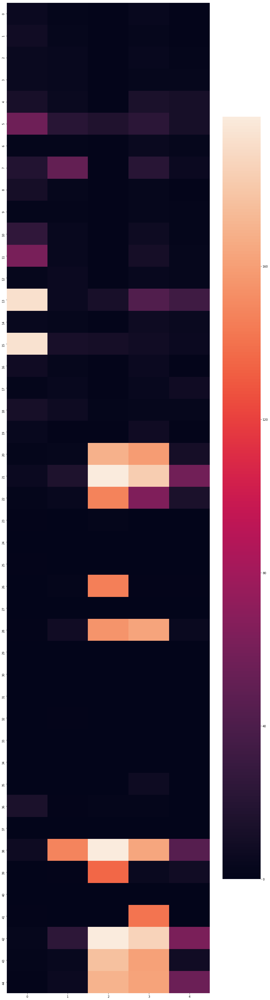

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt

model_fail_cnts = []
for i in range(0, 45):
    fail_cnts = []
    for model in tme_history:
        fail_cnts.append(model.fail_cmp_stats[i])
    model_fail_cnts.append(fail_cnts)

plt.figure(figsize=(16, 64))
sns.heatmap(model_fail_cnts)

44 0.9293541982769966


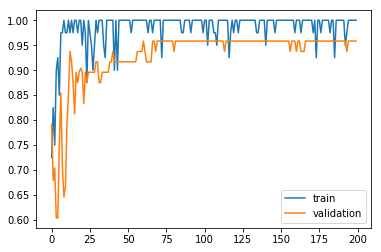

44 0.959645857512951


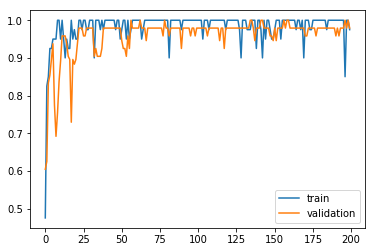

44 0.7825417122244835


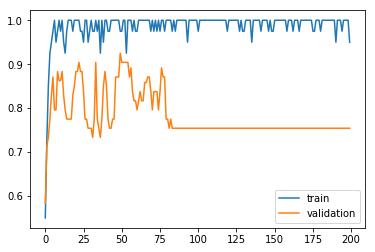

44 0.7945833268761635


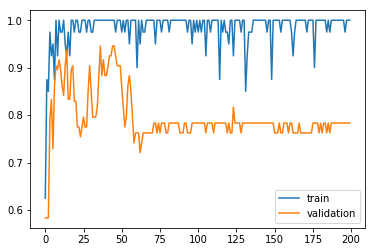

44 0.8775433000032004


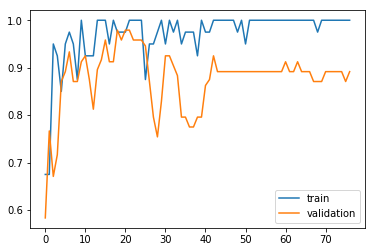

In [18]:
for th in tme_history:
    print(i, np.mean(th.val_ac_history))
    plt.plot(th.train_ac_history, label='train')
    plt.plot(th.val_ac_history, label='validation')
    plt.legend()
    plt.show()
    plt.pause(.001)
    

In [0]:
top_model = tme_history[1]
if len(tme_history) > 1:
    for tm in tme_history[1:]:
        if np.mean(tm.val_ac_history) > np.mean(top_model.val_ac_history):
            top_model = tm
model = top_model.model
    

rm: cannot remove 'submission.csv': No such file or directory


100%|██████████| 15/15 [01:19<00:00,  5.01s/it]


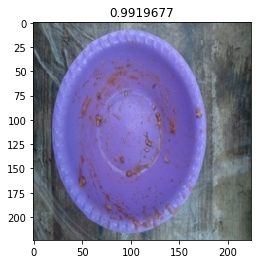

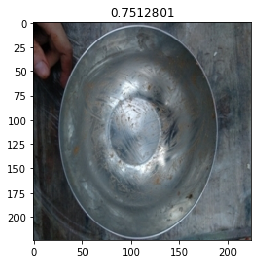

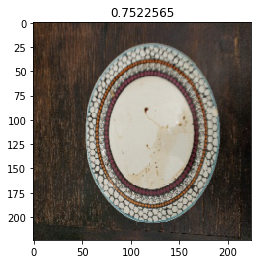

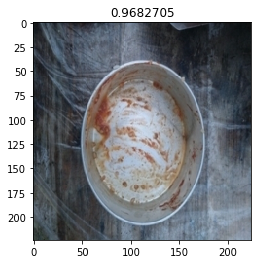

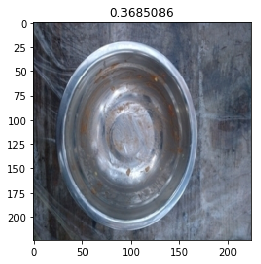

...

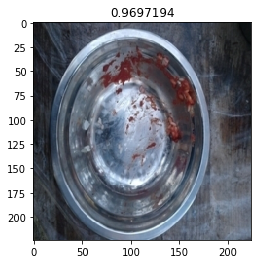

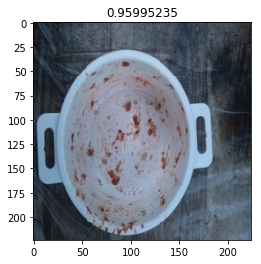

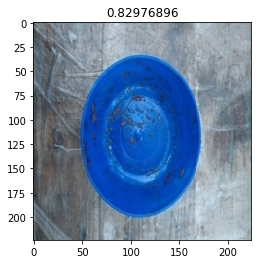

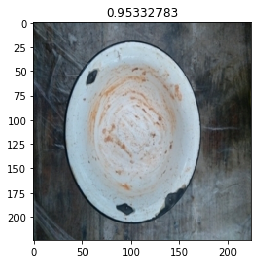

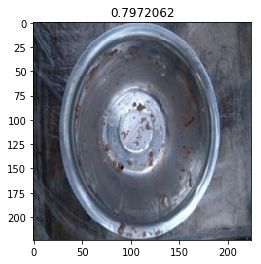

In [20]:
!rm -rf test
!rm submission.csv

test_dir = 'test'
shutil.copytree(os.path.join(data_root, 'test'), os.path.join(test_dir, 'unknown'))

class ImageFolderWithPaths(torchvision.datasets.ImageFolder):
    def __getitem__(self, index):
        original_tuple = super(ImageFolderWithPaths, self).__getitem__(index)
        path = self.imgs[index][0]
        tuple_with_path = (original_tuple + (path,))
        return tuple_with_path

test_dataset = ImageFolderWithPaths(test_dir, val_transforms)
test_dataloader = torch.utils.data.DataLoader(
    test_dataset, batch_size=50, shuffle=False, num_workers=batch_size)

for tm in tme_history:
    tm.model.eval()

test_predictions = []
test_img_paths = []

for inputs, labels, paths in tqdm(test_dataloader):
    inputs = inputs.to(device)
    labels = labels.to(device)
    with torch.set_grad_enabled(False):
        pr_preds = []
        for tm in tme_history:
            preds = tm.model(inputs)
            pr_preds.append(torch.nn.functional.softmax(preds, dim=1)[:,1].data.cpu().numpy())
        pp_result = pr_preds[0]
        for pp in pr_preds[1:]:
            pp_result += pp
        test_predictions.append(pp_result / len(tme_history))
    test_img_paths.extend(paths)
    
test_predictions = np.concatenate(test_predictions)

inputs, labels, paths = next(iter(test_dataloader))

for img, pred in zip(inputs, test_predictions):
    show_input(img, title=pred)

submission_df = pd.DataFrame.from_dict({'id': test_img_paths, 'label': test_predictions})
submission_df['label'] = submission_df['label'].map(lambda pred: 'dirty' if pred > 0.5 else 'cleaned')
submission_df['id'] = submission_df['id'].str.replace('test/unknown/', '')
submission_df['id'] = submission_df['id'].str.replace('.jpg', '')
submission_df.set_index('id', inplace=True)
submission_df.head(n=6)

submission_df.to_csv('submission.csv')

            

100%|██████████| 15/15 [00:16<00:00,  1.02s/it]


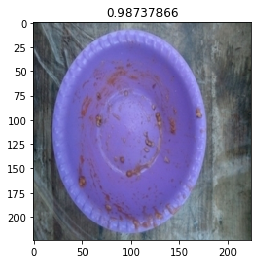

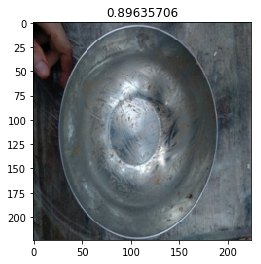

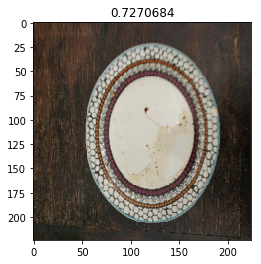

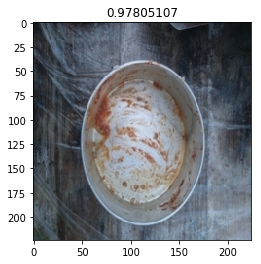

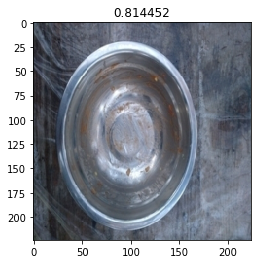

...

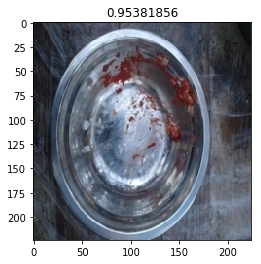

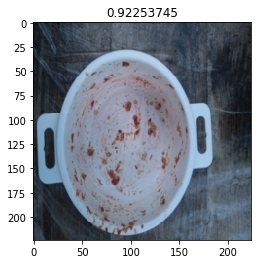

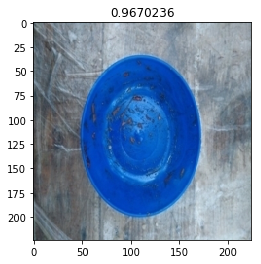

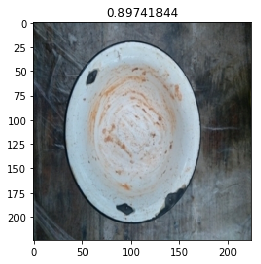

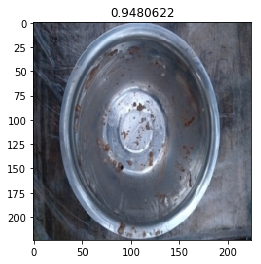

In [21]:
#%%

!rm -rf test
!rm submission.csv

test_dir = 'test'
shutil.copytree(os.path.join(data_root, 'test'), os.path.join(test_dir, 'unknown'))
model = tme_history[1].model

class ImageFolderWithPaths(torchvision.datasets.ImageFolder):
    def __getitem__(self, index):
        original_tuple = super(ImageFolderWithPaths, self).__getitem__(index)
        path = self.imgs[index][0]
        tuple_with_path = (original_tuple + (path,))
        return tuple_with_path
    
test_dataset = ImageFolderWithPaths(test_dir, val_transforms)

test_dataloader = torch.utils.data.DataLoader(
    test_dataset, batch_size=50, shuffle=False, num_workers=batch_size)

model.eval()

test_predictions = []
test_img_paths = []
for inputs, labels, paths in tqdm(test_dataloader):
    inputs = inputs.to(device)
    labels = labels.to(device)
    with torch.set_grad_enabled(False):
        preds = model(inputs)
    test_predictions.append(
        torch.nn.functional.softmax(preds, dim=1)[:,1].data.cpu().numpy())
    test_img_paths.extend(paths)
    
test_predictions = np.concatenate(test_predictions)

inputs, labels, paths = next(iter(test_dataloader))

for img, pred in zip(inputs, test_predictions):
    show_input(img, title=pred)
    
submission_df = pd.DataFrame.from_dict({'id': test_img_paths, 'label': test_predictions})
submission_df['label'] = submission_df['label'].map(lambda pred: 'dirty' if pred > 0.5 else 'cleaned')
submission_df['id'] = submission_df['id'].str.replace('test/unknown/', '')
submission_df['id'] = submission_df['id'].str.replace('.jpg', '')
submission_df.set_index('id', inplace=True)
submission_df.head(n=6)

submission_df.to_csv('submission.csv')

In [0]:
!ls -la

total 48
drwxr-xr-x 1 root root 4096 Jul 28 21:47 .
drwxr-xr-x 1 root root 4096 Jul 28 20:18 ..
drwxr-xr-x 1 root root 4096 Jul 19 16:14 .config
drwx------ 3 root root 4096 Jul 28 20:57 DRIVE
drwxr-xr-x 3 root root 4096 Jul 28 20:57 inputs
drwxr-xr-x 1 root root 4096 Jul 19 16:14 sample_data
-rw-r--r-- 1 root root 8653 Jul 28 21:47 submission.csv
drwxr-xr-x 3 root root 4096 Jul 28 21:47 test
drwxr-xr-x 4 root root 4096 Jul 28 21:01 train
drwxr-xr-x 4 root root 4096 Jul 28 21:01 val
